In [1]:
#Load packages used in notebook
import pandas as pd
import numpy as np
import seaborn as sns
import datetime
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from statsmodels.tsa.holtwinters import Holt
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tools.eval_measures import rmse
import matplotlib.pyplot as plt

%matplotlib inline

In [2]:
# Define error metric as a function
def mape(y_actual, y_predicted):
    return round(np.mean(np.abs((y_actual - y_predicted) / y_actual)) * 100, 1)

## Dataset

In [3]:
# Load Data from excel file
sales_seg2 = pd.read_excel(r'C:\Users\Mike\Documents\Grad School 2021\Data Science Capstone\Michael_V2_edit.xlsx',
                         sheet_name = "Data Set D2")
sales_seg2.head(30)

,Product Code,ABC,XYZ,2019-01-12 00:00:00,2019-01-19 00:00:00,2019-01-26 00:00:00,2019-02-02 00:00:00,2019-02-09 00:00:00,2019-02-16 00:00:00,2019-02-23 00:00:00,...,2022-07-23 00:00:00,2022-07-30 00:00:00,2022-08-06 00:00:00,2022-08-13 00:00:00,2022-08-20 00:00:00,2022-08-27 00:00:00,2022-09-03 00:00:00,2022-09-10 00:00:00,2022-09-17 00:00:00,2022-09-24 00:00:00
0,P385,B,X,10341.16,11584.67,13475.66,10921.66,10718.16,10444.34,11484.16,...,12432.168,11709.501,13303.501,10630.003,12886.667,12385.003,12721.171,10841.834,12489.834,12859.335
1,P386,B,X,18503.50,18859.67,21890.66,22154.82,20727.33,19390.67,18622.67,...,11705.336,11847.501,14069.336,11440.672,12779.334,11570.670,11536.504,11672.000,10365.335,11667.504
2,P387,A,X,62371.49,62779.99,68225.84,71621.65,68234.17,58880.00,67244.49,...,46474.667,49052.165,48356.333,44600.840,47307.832,45928.339,49034.505,44934.666,40428.167,42539.673
3,P388,A,X,58262.17,58651.17,66649.67,69476.82,62580.32,58426.00,59887.99,...,48638.335,56718.333,58260.833,53922.671,51891.833,54119.008,52838.340,47007.002,48752.335,47899.172
4,P389,B,X,21206.50,18933.69,21748.34,26492.49,22998.16,21996.15,22935.32,...,19004.168,18411.334,23546.337,20088.006,19457.835,19673.009,18225.170,19332.667,19654.168,18272.172
5,P390,A,X,83144.49,81917.50,97388.00,88998.29,87861.97,80625.50,92491.67,...,66547.005,73437.335,77564.174,69624.839,71573.835,74385.011,71403.004,68077.334,66704.501,65659.173
6,P391,A,X,101224.99,101380.00,120987.99,107066.83,108697.83,94757.19,109902.66,...,80350.338,83156.668,85998.669,88019.672,85578.334,85924.675,86886.171,78867.834,83234.001,80534.006
7,P392,B,X,15554.83,16557.51,18365.84,15472.34,19456.85,20174.32,19496.50,...,8051.502,8532.834,9673.504,9386.004,8981.834,8182.677,9111.672,7999.001,9067.167,8556.173
8,P393,B,X,11153.50,10874.50,12278.50,12526.83,11942.50,10918.66,12213.67,...,15806.501,16139.501,16089.668,16368.337,18362.835,17185.669,20911.501,18990.169,17507.501,17627.169
9,P394,A,X,13298.50,13528.67,16392.83,13624.98,18014.84,9757.33,12287.17,...,33222.001,35743.500,39047.667,39989.835,38998.501,37235.169,38738.168,36205.001,40947.167,30905.167


In [4]:
# Combine both segmentation columns to get segment identifiers
sales_seg2["vol_vol"] = sales_seg2['ABC']+sales_seg2['XYZ']
segments = pd.DataFrame(sales_seg2.vol_vol.value_counts())
segments

,vol_vol
CX,25
CY,19
CZ,13
NP,11
AX,10
BX,8


In [5]:
# Set product code as index for the table
sales_seg2.set_index(['Product Code'], inplace = True)
sales_seg2.head(20)

,ABC,XYZ,2019-01-12 00:00:00,2019-01-19 00:00:00,2019-01-26 00:00:00,2019-02-02 00:00:00,2019-02-09 00:00:00,2019-02-16 00:00:00,2019-02-23 00:00:00,2019-03-02 00:00:00,...,2022-07-30 00:00:00,2022-08-06 00:00:00,2022-08-13 00:00:00,2022-08-20 00:00:00,2022-08-27 00:00:00,2022-09-03 00:00:00,2022-09-10 00:00:00,2022-09-17 00:00:00,2022-09-24 00:00:00,vol_vol
Product Code,,,,,,,,,,,,,,,,,,,,,
P385,B,X,10341.16,11584.67,13475.66,10921.66,10718.16,10444.34,11484.16,9770.00,...,11709.501,13303.501,10630.003,12886.667,12385.003,12721.171,10841.834,12489.834,12859.335,BX
P386,B,X,18503.50,18859.67,21890.66,22154.82,20727.33,19390.67,18622.67,24461.67,...,11847.501,14069.336,11440.672,12779.334,11570.670,11536.504,11672.000,10365.335,11667.504,BX
P387,A,X,62371.49,62779.99,68225.84,71621.65,68234.17,58880.00,67244.49,76281.84,...,49052.165,48356.333,44600.840,47307.832,45928.339,49034.505,44934.666,40428.167,42539.673,AX
P388,A,X,58262.17,58651.17,66649.67,69476.82,62580.32,58426.00,59887.99,68231.98,...,56718.333,58260.833,53922.671,51891.833,54119.008,52838.340,47007.002,48752.335,47899.172,AX
P389,B,X,21206.50,18933.69,21748.34,26492.49,22998.16,21996.15,22935.32,25290.65,...,18411.334,23546.337,20088.006,19457.835,19673.009,18225.170,19332.667,19654.168,18272.172,BX
P390,A,X,83144.49,81917.50,97388.00,88998.29,87861.97,80625.50,92491.67,100542.33,...,73437.335,77564.174,69624.839,71573.835,74385.011,71403.004,68077.334,66704.501,65659.173,AX
P391,A,X,101224.99,101380.00,120987.99,107066.83,108697.83,94757.19,109902.66,115165.79,...,83156.668,85998.669,88019.672,85578.334,85924.675,86886.171,78867.834,83234.001,80534.006,AX
P392,B,X,15554.83,16557.51,18365.84,15472.34,19456.85,20174.32,19496.50,19401.12,...,8532.834,9673.504,9386.004,8981.834,8182.677,9111.672,7999.001,9067.167,8556.173,BX
P393,B,X,11153.50,10874.50,12278.50,12526.83,11942.50,10918.66,12213.67,8540.16,...,16139.501,16089.668,16368.337,18362.835,17185.669,20911.501,18990.169,17507.501,17627.169,BX


### Segment Breakout

In [6]:
# Separate out segments
sales2_ax = sales_seg2.loc[(sales_seg2.ABC == "A") & (sales_seg2.XYZ == "X")]
sales2_bx = sales_seg2.loc[(sales_seg2.ABC == "B") & (sales_seg2.XYZ == "X")]
sales2_cx = sales_seg2.loc[(sales_seg2.ABC == "C") & (sales_seg2.XYZ == "X")]
sales2_cy = sales_seg2.loc[(sales_seg2.ABC == "C") & (sales_seg2.XYZ == "Y")]
sales2_cz = sales_seg2.loc[(sales_seg2.ABC == "C") & (sales_seg2.XYZ == "Z")]
sales2_np = sales_seg2.loc[(sales_seg2.ABC == "N") & (sales_seg2.XYZ == "P")]

pd.set_option('display.max_columns', None)

In [7]:
# Check a segment
sales2_ax.head(10)

,ABC,XYZ,2019-01-12 00:00:00,2019-01-19 00:00:00,2019-01-26 00:00:00,2019-02-02 00:00:00,2019-02-09 00:00:00,2019-02-16 00:00:00,2019-02-23 00:00:00,2019-03-02 00:00:00,2019-03-09 00:00:00,2019-03-16 00:00:00,2019-03-23 00:00:00,2019-03-30 00:00:00,2019-04-06 00:00:00,2019-04-13 00:00:00,2019-04-20 00:00:00,2019-04-27 00:00:00,2019-05-04 00:00:00,2019-05-11 00:00:00,2019-05-18 00:00:00,2019-05-25 00:00:00,2019-06-01 00:00:00,2019-06-08 00:00:00,2019-06-15 00:00:00,2019-06-22 00:00:00,2019-06-29 00:00:00,2019-07-06 00:00:00,2019-07-13 00:00:00,2019-07-20 00:00:00,2019-07-27 00:00:00,2019-08-03 00:00:00,2019-08-10 00:00:00,2019-08-17 00:00:00,2019-08-24 00:00:00,2019-08-31 00:00:00,2019-09-07 00:00:00,2019-09-14 00:00:00,2019-09-21 00:00:00,2019-09-28 00:00:00,2019-10-05 00:00:00,2019-10-12 00:00:00,2019-10-19 00:00:00,2019-10-26 00:00:00,2019-11-02 00:00:00,2019-11-09 00:00:00,2019-11-16 00:00:00,2019-11-23 00:00:00,2019-11-30 00:00:00,2019-12-07 00:00:00,2019-12-14 00:00:00,2019-12-21 00:00:00,2019-12-28 00:00:00,2020-01-04 00:00:00,2020-01-11 00:00:00,2020-01-18 00:00:00,2020-01-25 00:00:00,2020-02-01 00:00:00,2020-02-08 00:00:00,2020-02-15 00:00:00,2020-02-22 00:00:00,2020-02-29 00:00:00,2020-03-07 00:00:00,2020-03-14 00:00:00,2020-03-21 00:00:00,2020-03-28 00:00:00,2020-04-04 00:00:00,2020-04-11 00:00:00,2020-04-18 00:00:00,2020-04-25 00:00:00,2020-05-02 00:00:00,2020-05-09 00:00:00,2020-05-16 00:00:00,2020-05-23 00:00:00,2020-05-30 00:00:00,2020-06-06 00:00:00,2020-06-13 00:00:00,2020-06-20 00:00:00,2020-06-27 00:00:00,2020-07-04 00:00:00,2020-07-11 00:00:00,2020-07-18 00:00:00,2020-07-25 00:00:00,2020-08-01 00:00:00,2020-08-08 00:00:00,2020-08-15 00:00:00,2020-08-22 00:00:00,2020-08-29 00:00:00,2020-09-05 00:00:00,2020-09-12 00:00:00,2020-09-19 00:00:00,2020-09-26 00:00:00,2020-10-03 00:00:00,2020-10-10 00:00:00,2020-10-17 00:00:00,2020-10-24 00:00:00,2020-10-31 00:00:00,2020-11-07 00:00:00,2020-11-14 00:00:00,2020-11-21 00:00:00,2020-11-28 00:00:00,2020-12-05 00:00:00,2020-12-12 00:00:00,2020-12-19 00:00:00,2020-12-26 00:00:00,2021-01-02 00:00:00,2021-01-09 00:00:00,2021-01-16 00:00:00,2021-01-23 00:00:00,2021-01-30 00:00:00,2021-02-06 00:00:00,2021-02-13 00:00:00,2021-02-20 00:00:00,2021-02-27 00:00:00,2021-03-06 00:00:00,2021-03-13 00:00:00,2021-03-20 00:00:00,2021-03-27 00:00:00,2021-04-03 00:00:00,2021-04-10 00:00:00,2021-04-17 00:00:00,2021-04-24 00:00:00,2021-05-01 00:00:00,2021-05-08 00:00:00,2021-05-15 00:00:00,2021-05-22 00:00:00,2021-05-29 00:00:00,2021-06-05 00:00:00,2021-06-12 00:00:00,2021-06-19 00:00:00,2021-06-26 00:00:00,2021-07-03 00:00:00,2021-07-10 00:00:00,2021-07-17 00:00:00,2021-07-24 00:00:00,2021-07-31 00:00:00,2021-08-07 00:00:00,2021-08-14 00:00:00,2021-08-21 00:00:00,2021-08-28 00:00:00,2021-09-04 00:00:00,2021-09-11 00:00:00,2021-09-18 00:00:00,2021-09-25 00:00:00,2021-10-02 00:00:00,2021-10-09 00:00:00,2021-10-16 00:00:00,2021-10-23 00:00:00,2021-10-30 00:00:00,2021-11-06 00:00:00,2021-11-13 00:00:00,2021-11-20 00:00:00,2021-11-27 00:00:00,2021-12-04 00:00:00,2021-12-11 00:00:00,2021-12-18 00:00:00,2021-12-25 00:00:00,2022-01-01 00:00:00,2022-01-08 00:00:00,2022-01-15 00:00:00,2022-01-22 00:00:00,2022-01-29 00:00:00,2022-02-05 00:00:00,2022-02-12 00:00:00,2022-02-19 00:00:00,2022-02-26 00:00:00,2022-03-05 00:00:00,2022-03-12 00:00:00,2022-03-19 00:00:00,2022-03-26 00:00:00,2022-04-02 00:00:00,2022-04-09 00:00:00,2022-04-16 00:00:00,2022-04-23 00:00:00,2022-04-30 00:00:00,2022-05-07 00:00:00,2022-05-14 00:00:00,2022-05-21 00:00:00,2022-05-28 00:00:00,2022-06-04 00:00:00,2022-06-11 00:00:00,2022-06-18 00:00:00,2022-06-25 00:00:00,2022-07-02 00:00:00,2022-07-09 00:00:00,2022-07-16 00:00:00,2022-07-23 00:00:00,2022-07-30 00:00:00,2022-08-06 00:00:00,2022-08-13 00:00:00,2022-08-20 00:00:00,2022-08-27 00:00:00,2022-09-03 00:00:00,2022-09-10 00:00:00,2022-09-17 00:00:00,2022-09-24 00:00:00,vol_vol
Product Code,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,

## Descriptive Statistics

In [8]:
# Transpose to get dates as index and generate descriptive statistics

sales2_ax = sales2_ax.drop(columns = ['ABC', 'XYZ', 'vol_vol'])
s2_ax = sales2_ax.transpose()
s2_ax.index.set_names('Week', inplace = True)
s2_ax.index = pd.to_datetime(s2_ax.index)
s2_ax_describe = s2_ax.describe().applymap('{:,.0f}'.format)

sales2_bx = sales2_bx.drop(columns = ['ABC', 'XYZ', 'vol_vol'])
s2_bx = sales2_bx.transpose()
s2_bx.index.set_names('Week', inplace = True)
s2_bx.index = pd.to_datetime(s2_bx.index)
s2_bx_describe = s2_bx.describe().applymap('{:,.0f}'.format)
    
sales2_cx = sales2_cx.drop(columns = ['ABC', 'XYZ', 'vol_vol'])
s2_cx = sales2_cx.transpose()
s2_cx.index.set_names('Week', inplace = True)
s2_cx.index = pd.to_datetime(s2_cx.index)
s2_cx_describe = s2_cx.describe().applymap('{:,.0f}'.format)

sales2_cy = sales2_cy.drop(columns = ['ABC', 'XYZ', 'vol_vol'])
s2_cy = sales2_cy.transpose()
s2_cy.index.set_names('Week', inplace = True)
s2_cy.index = pd.to_datetime(s2_cy.index)
s2_cy_describe = s2_cy.describe().applymap('{:,.0f}'.format)

sales2_cz = sales2_cz.drop(columns = ['ABC', 'XYZ', 'vol_vol'])
s2_cz = sales2_cz.transpose()
s2_cz.index.set_names('Week', inplace = True)
s2_cz.index = pd.to_datetime(s2_cz.index)
s2_cz_describe = s2_cz.describe().applymap('{:,.0f}'.format)

sales2_np = sales2_np.drop(columns = ['ABC', 'XYZ', 'vol_vol'])
s2_np = sales2_np.transpose()
s2_np.index.set_names('Week', inplace = True)
s2_np.index = pd.to_datetime(s2_np.index)
s2_np_describe = s2_np.describe().applymap('{:,.0f}'.format)

In [9]:
s2_ax_describe

Product Code,P387,P388,P390,P391,P394,P407,P408,P409,P412,P417
count,194,194,194,194,194,194,194,194,194,194
mean,"61,530","64,403","91,948","105,076","28,753","28,287","36,198","33,445","50,761","54,099"
std,"9,261","8,314","13,863","14,383","8,036","4,753","8,488","6,506","8,192","9,652"
min,"40,428","42,826","55,053","62,964","9,757","9,680","12,320","11,920","29,090","29,850"
25%,"56,230","58,761","83,102","95,000","20,173","24,560","29,278","28,280","43,706","44,634"
50%,"61,320","64,047","91,993","105,145","31,766","28,628","37,480","34,184","52,501","55,760"
75%,"66,989","69,468","100,507","112,357","34,411","31,302","41,360","37,900","57,098","61,923"
max,"95,232","87,968","134,032","148,292","44,219","44,226","63,840","55,439","68,529","73,308"


In [10]:
s2_bx_describe

Product Code,P385,P386,P389,P392,P393,P405,P406,P440
count,194,194,194,194,194,194,194,194
mean,"14,640","17,374","23,897","15,931","15,673","7,903","18,193","8,382"
std,"2,894","3,118","3,378","3,849","2,968","1,753","2,885","2,058"
min,"8,282","9,530","15,158","7,774","8,540",1,"6,560","2,880"
25%,"12,447","15,408","22,008","13,536","13,665","6,960","16,190","7,040"
50%,"14,647","17,448","24,119","16,397","15,884","8,160","18,240","8,240"
75%,"16,853","19,539","25,929","18,695","17,614","8,960","20,316","9,820"
max,"22,108","25,234","33,721","24,220","23,934","11,659","29,680","14,960"


In [11]:
s2_cx_describe

Product Code,P401,P402,P410,P415,P416,P418,P421,P422,P424,P426,P430,P437,P438,P439,P441,P442,P447,P452,P453,P454,P455,P457,P458,P459,P460
count,194,194,194,194,194,194,194,194,194,194,194,194,194,194,194,194,194,175,175,175,175,161,161,161,161
mean,"4,517","3,223","4,791","1,317","1,145","1,164","1,027",392,"1,011",864,645,384,"5,118","4,819","6,410","3,046","8,264","1,108",983,"1,617","1,290","2,661","3,211","3,986","5,052"
std,"1,629","1,158","1,607",413,383,413,361,163,320,316,249,282,"1,517","1,434","1,817","1,002","2,224",394,395,571,475,866,"1,033","1,459","1,706"
min,1,1,1,1,1,80,48,1,1,1,160,1,720,"1,200","2,240",1,"1,664",144,1,320,224,160,160,160,128
25%,"3,597","2,564","3,760","1,120",960,876,784,320,820,624,480,208,"4,160","3,780","5,280","2,560","6,643",880,720,"1,280","1,009","2,255","2,640","2,960","4,015"
50%,"4,640","3,264","4,794","1,280","1,120","1,192","1,040",400,"1,008",832,640,296,"4,960","4,760","6,320","3,040","8,254","1,104",976,"1,600","1,232","2,640","3,200","3,920","5,120"
75%,"5,476","3,900","6,000","1,680","1,440","1,436","1,280",480,"1,212","1,081",735,492,"6,080","5,645","7,520","3,600","10,104","1,360","1,208","1,920","1,538","2,960","3,680","4,880","6,160"
max,"9,824","7,248","9,760","2,480","2,480","2,640","2,256","1,120","2,024","1,728","1,520","1,840","13,120","10,160","12,480","5,760","13,419","3,680","3,127","3,520","2,720","6,640","7,185","8,738","10,608"


In [12]:
s2_cy_describe

Product Code,P396,P397,P399,P400,P419,P420,P423,P425,P427,P428,P429,P431,P432,P433,P434,P448,P449,P450,P451
count,194,194,194,194,194,194,194,194,194,194,194,194,194,194,194,176,175,177,177
mean,707,"1,603","1,912","1,090","1,243",610,360,614,395,551,502,708,974,850,864,"2,227","2,140","4,204","3,149"
std,334,652,774,485,447,257,188,264,161,213,198,305,356,327,342,"1,038",931,"1,701","1,368"
min,1,1,1,1,1,1,1,1,1,1,1,80,1,1,48,534,542,"1,177",530
25%,480,"1,200","1,456",800,960,445,240,432,320,480,400,560,776,640,640,"1,600","1,503","3,108","2,256"
50%,640,"1,544","1,808","1,056","1,216",640,320,560,400,480,480,640,960,800,880,"1,920","1,907","3,806","2,865"
75%,880,"2,000","2,312","1,340","1,520",780,479,768,480,640,560,880,"1,120","1,040","1,120","2,631","2,558","4,960","3,820"
max,"1,840","4,320","4,208","2,768","3,346","1,456","1,232","1,456",960,"1,302","1,200","1,998","2,240","2,000","2,000","5,920","5,082","9,616","7,760"


In [13]:
s2_cz_describe

Product Code,P395,P398,P403,P404,P413,P414,P435,P436,P443,P444,P445,P446,P456
count,194,194,194,194,194,194,194,192,184,184,184,184,157
mean,730,"1,276","8,465","7,501",550,480,362,515,"1,294","1,697","1,889",851,444
std,394,595,"4,098","4,175",199,199,191,711,803,744,"1,172",414,381
min,1,1,1,1,1,1,1,1,1,1,1,1,1
25%,480,880,"5,760","4,480",480,320,240,1,800,"1,200","1,120",640,235
50%,720,"1,200","7,920","6,160",480,480,320,1,"1,280","1,760","1,680",800,320
75%,960,"1,600","11,580","10,559",720,640,476,"1,520","1,600","2,160","2,500","1,040",559
max,"2,000","4,560","20,080","20,080","1,184","1,040","1,520","1,520","5,920","3,520","7,200","2,370","1,679"


In [14]:
s2_np_describe

Product Code,P411,P461,P462,P463,P464,P465,P466,P467,P468,P469,P470
count,36,89,89,90,90,82,49,49,49,49,49
mean,"1,962","1,189","1,343","2,205","2,404",969,284,365,923,506,242
std,"1,597",775,860,988,944,"1,420",232,433,"1,046",604,330
min,1,1,1,1,1,1,1,1,1,1,1
25%,640,1,"1,512","1,520","1,520",1,80,1,224,80,1
50%,"1,560","1,520","1,520","1,520","3,040",374,256,240,592,352,160
75%,"2,580","1,520","1,520","3,040","3,040","1,440",480,560,"1,040",672,320
max,"7,920","3,040","3,040","4,560","4,560","8,800",800,"1,872","4,932","2,800","1,460"


### Historical Sales by Segment - Line graphs of sales history

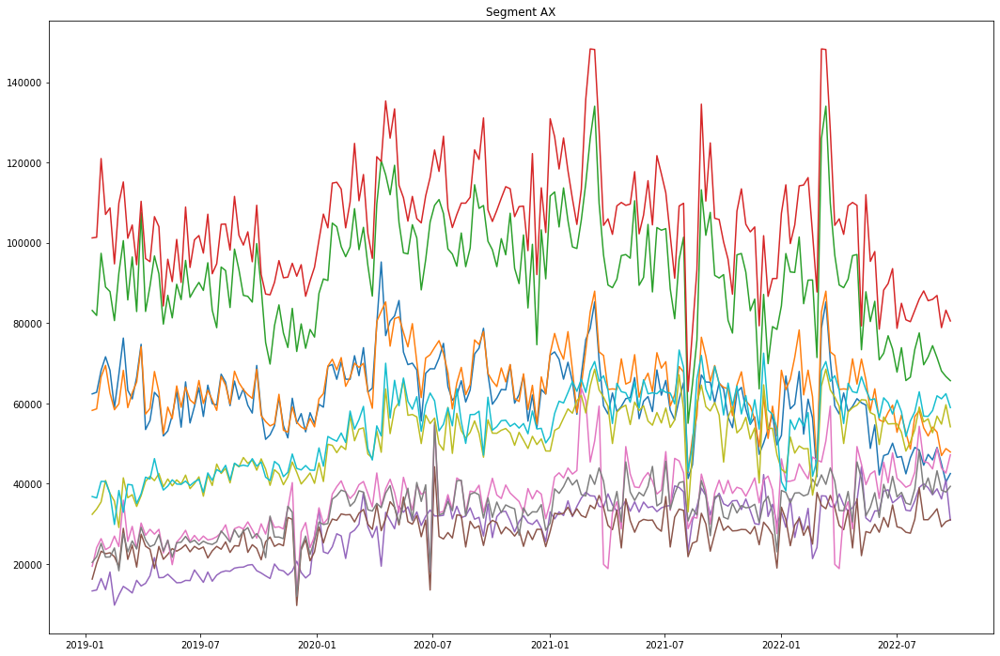

In [15]:
plt.figure(figsize = (18,12))
plt.title('Segment AX')
for item in s2_ax.columns:
    plt.plot(s2_ax.index, s2_ax[item], linestyle = '-')
plt.show()

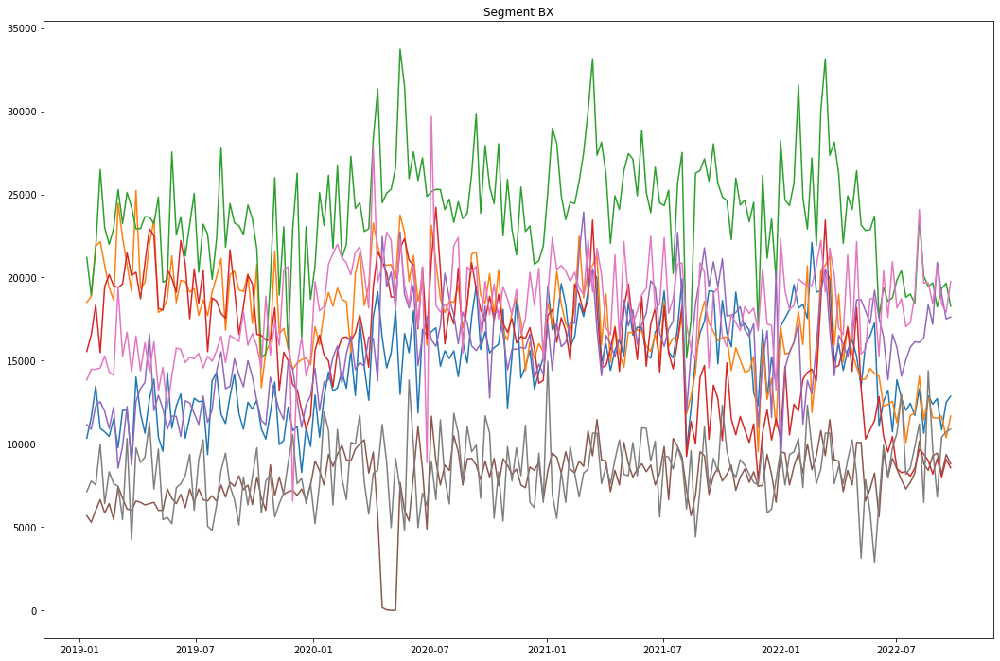

In [16]:
plt.figure(figsize = (18,12))
plt.title('Segment BX')
for item in s2_bx.columns:
    plt.plot(s2_bx.index, s2_bx[item], linestyle = '-')
plt.show()

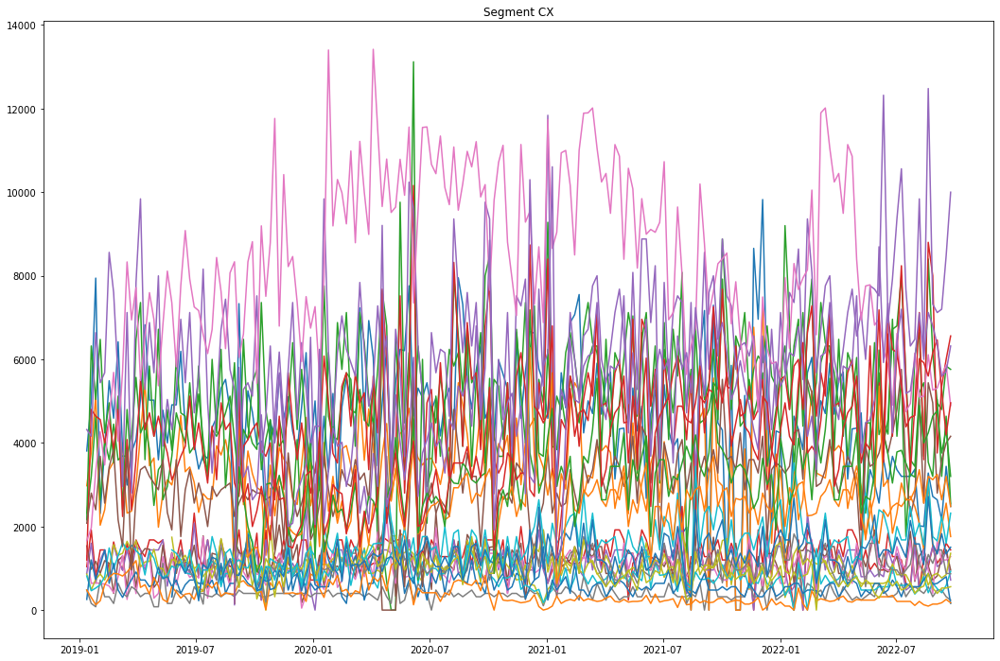

In [17]:
plt.figure(figsize = (18,12))
plt.title('Segment CX')
for item in s2_cx.columns:
    plt.plot(s2_cx.index, s2_cx[item], linestyle = '-')
plt.show()

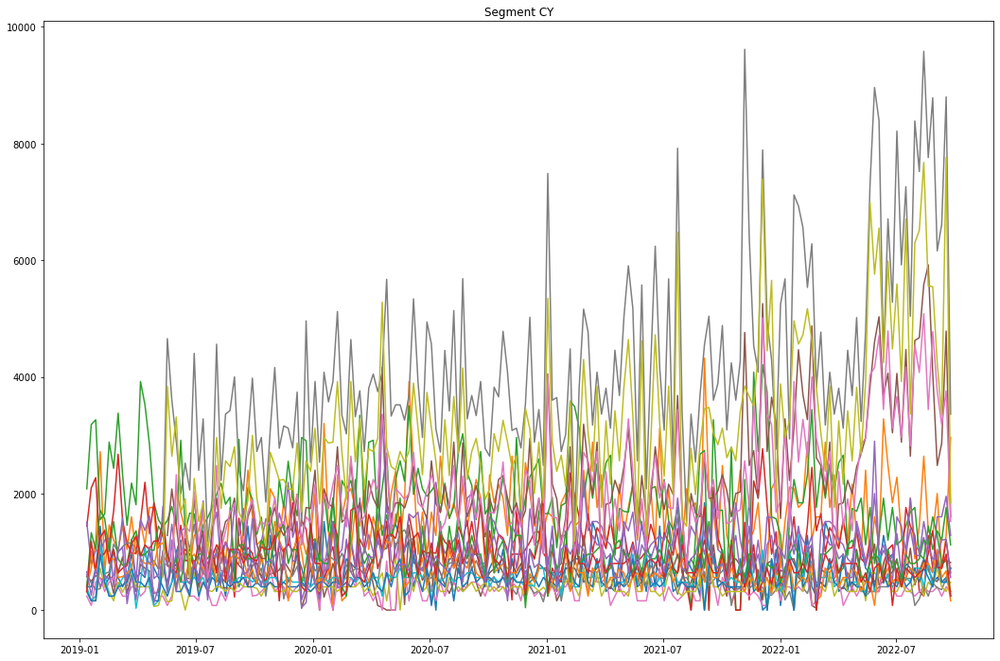

In [18]:
plt.figure(figsize = (18,12))
plt.title('Segment CY')
for item in s2_cy.columns:
    plt.plot(s2_cy.index, s2_cy[item], linestyle = '-')
plt.show()

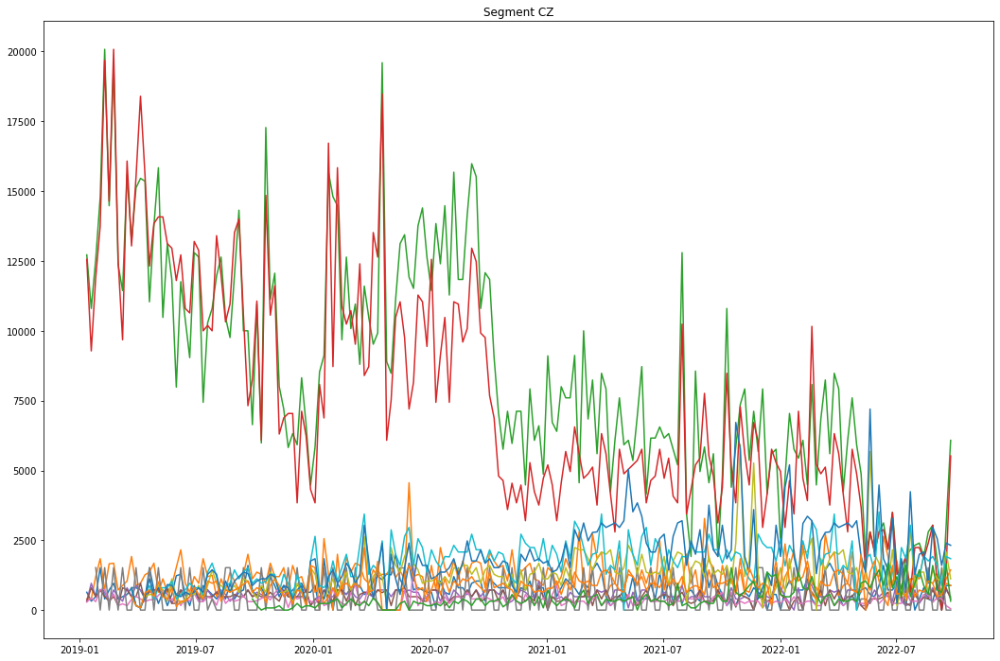

In [19]:
plt.figure(figsize = (18,12))
plt.title('Segment CZ')
for item in s2_cz.columns:
    plt.plot(s2_cz.index, s2_cz[item], linestyle = '-')
plt.show()

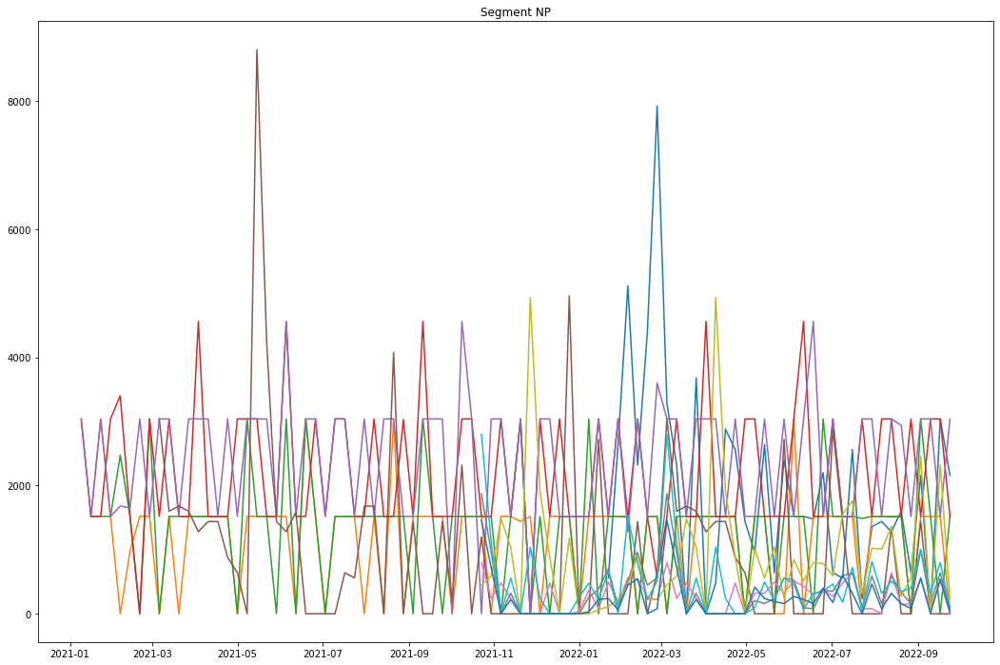

In [20]:
plt.figure(figsize = (18,12))
plt.title('Segment NP')
for item in s2_np.columns:
    plt.plot(s2_np.index, s2_np[item], linestyle = '-')
plt.show()

### Historical Sales by Segment - Box Plots

<AxesSubplot:title={'center':'Segment AX'}, xlabel='Product Code', ylabel='Weekly Cases'>

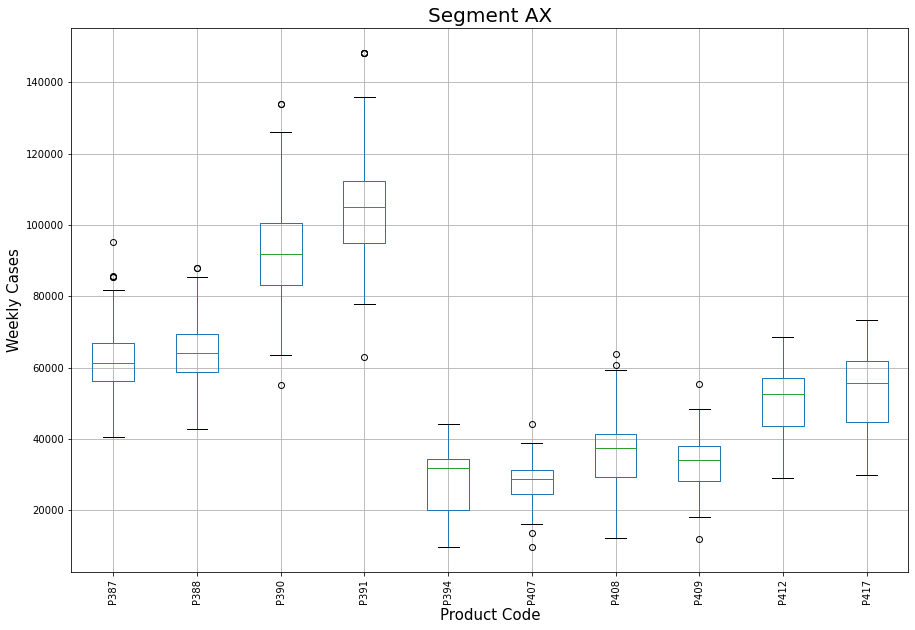

In [21]:
bp_ax = s2_ax.boxplot(rot = 90, figsize = (15,10))
bp_ax.set_title('Segment AX', size = 20)
bp_ax.set_xlabel('Product Code', size = 15)
bp_ax.set_ylabel('Weekly Cases', size = 15)
bp_ax

<AxesSubplot:title={'center':'Segment BX'}, xlabel='Product Code', ylabel='Weekly Cases'>

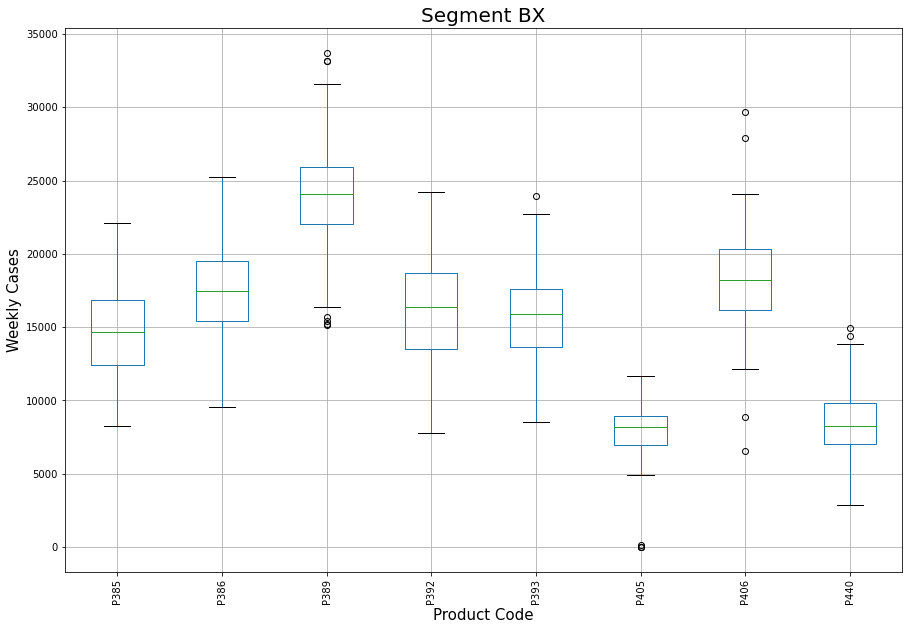

In [22]:
bp_bx = s2_bx.boxplot(rot = 90, figsize = (15,10))
bp_bx.set_title('Segment BX', size = 20)
bp_bx.set_xlabel('Product Code', size = 15)
bp_bx.set_ylabel('Weekly Cases', size = 15)
bp_bx

<AxesSubplot:title={'center':'Segment CX'}, xlabel='Product Code', ylabel='Weekly Cases'>

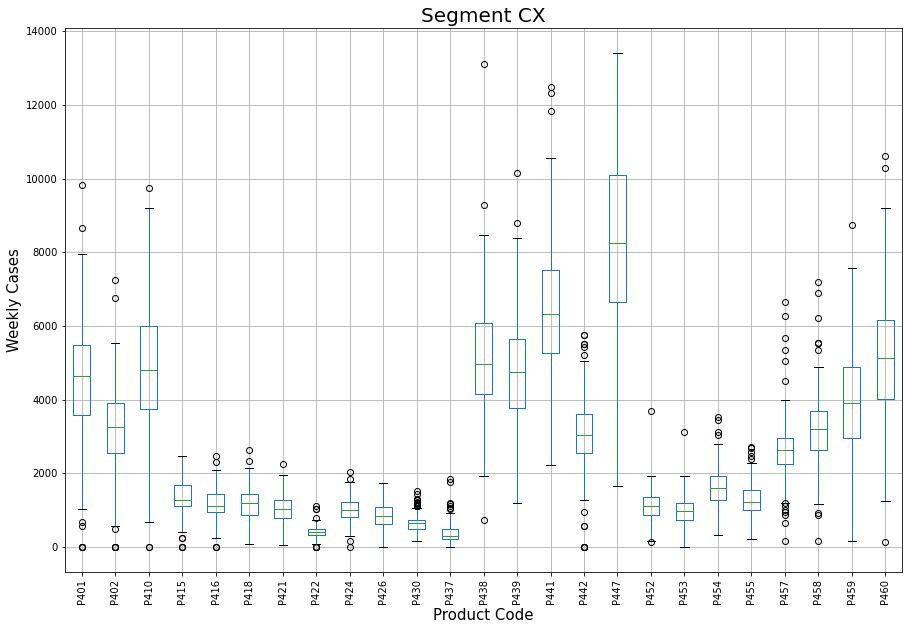

In [23]:
bp_cx = s2_cx.boxplot(rot = 90, figsize = (15,10))
bp_cx.set_title('Segment CX', size = 20)
bp_cx.set_xlabel('Product Code', size = 15)
bp_cx.set_ylabel('Weekly Cases', size = 15)
bp_cx

<AxesSubplot:title={'center':'Segment CY'}, xlabel='Product Code', ylabel='Weekly Cases'>

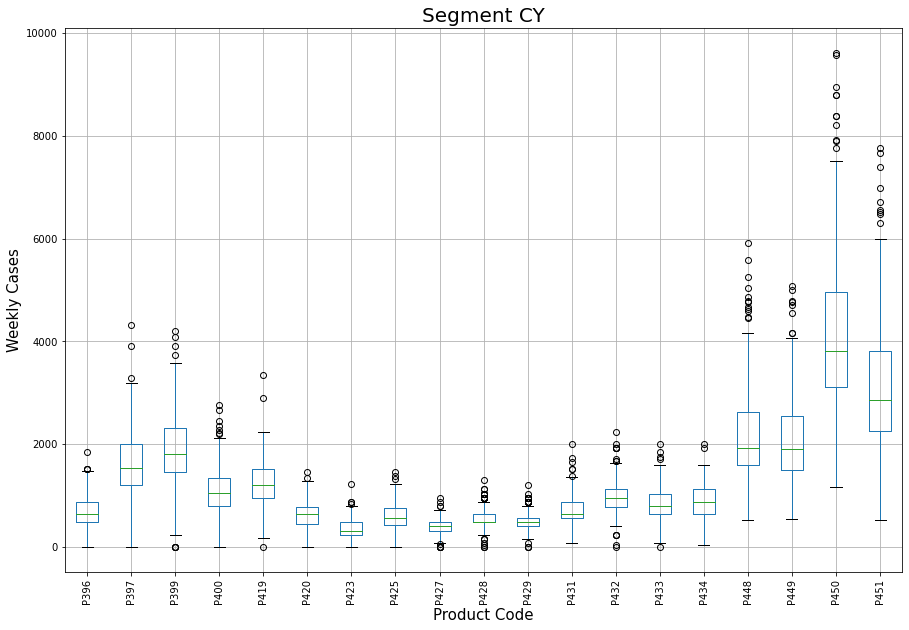

In [24]:
bp_cy = s2_cy.boxplot(rot = 90, figsize = (15,10))
bp_cy.set_title('Segment CY', size = 20)
bp_cy.set_xlabel('Product Code', size = 15)
bp_cy.set_ylabel('Weekly Cases', size = 15)
bp_cy

<AxesSubplot:title={'center':'Segment CZ'}, xlabel='Product Code', ylabel='Weekly Cases'>

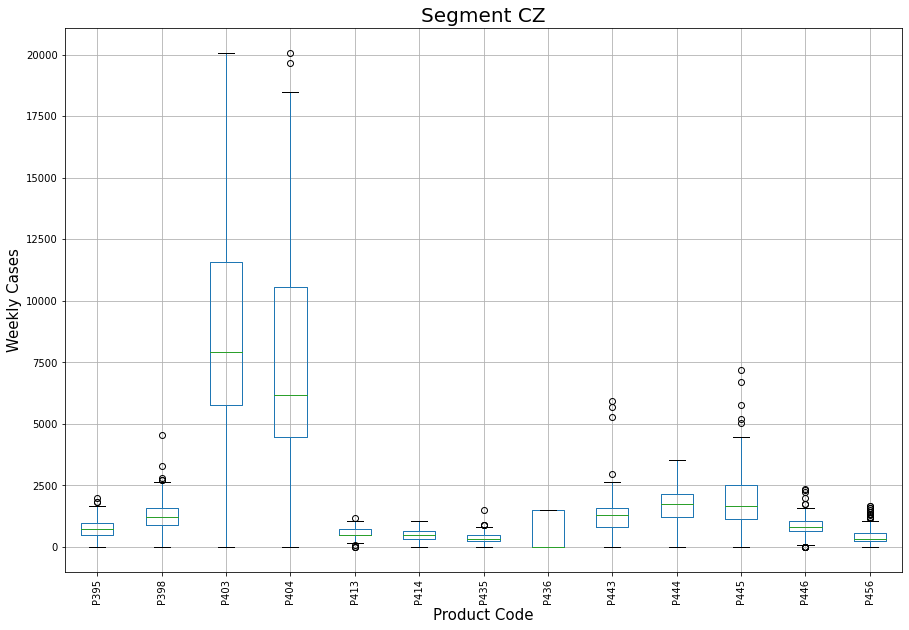

In [25]:
bp_cz = s2_cz.boxplot(rot = 90, figsize = (15,10))
bp_cz.set_title('Segment CZ', size = 20)
bp_cz.set_xlabel('Product Code', size = 15)
bp_cz.set_ylabel('Weekly Cases', size = 15)
bp_cz

<AxesSubplot:title={'center':'Segment NP'}, xlabel='Product Code', ylabel='Weekly Cases'>

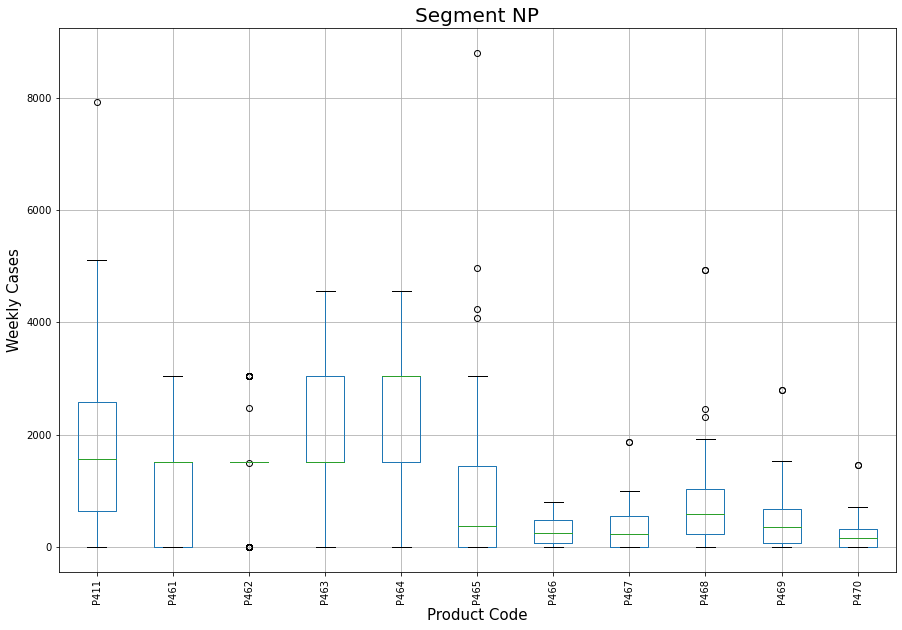

In [26]:
bp_np = s2_np.boxplot(rot = 90, figsize = (15,10))
bp_np.set_title('Segment NP', size = 20)
bp_np.set_xlabel('Product Code', size = 15)
bp_np.set_ylabel('Weekly Cases', size = 15)
bp_np

## Model Training and Forecasting Prediction Plots

### Segment AX

C:\Users\Mike\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
<ipython-input-27-dadd78569617>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pred_ax2[triple_label] = triple.forecast(13)
C:\Users\Mike\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  warnings.warn('No frequency information was'
C:\Users\Mike\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
<ipython-input-27-dadd78569617>:14: SettingWithCopyWarning: 

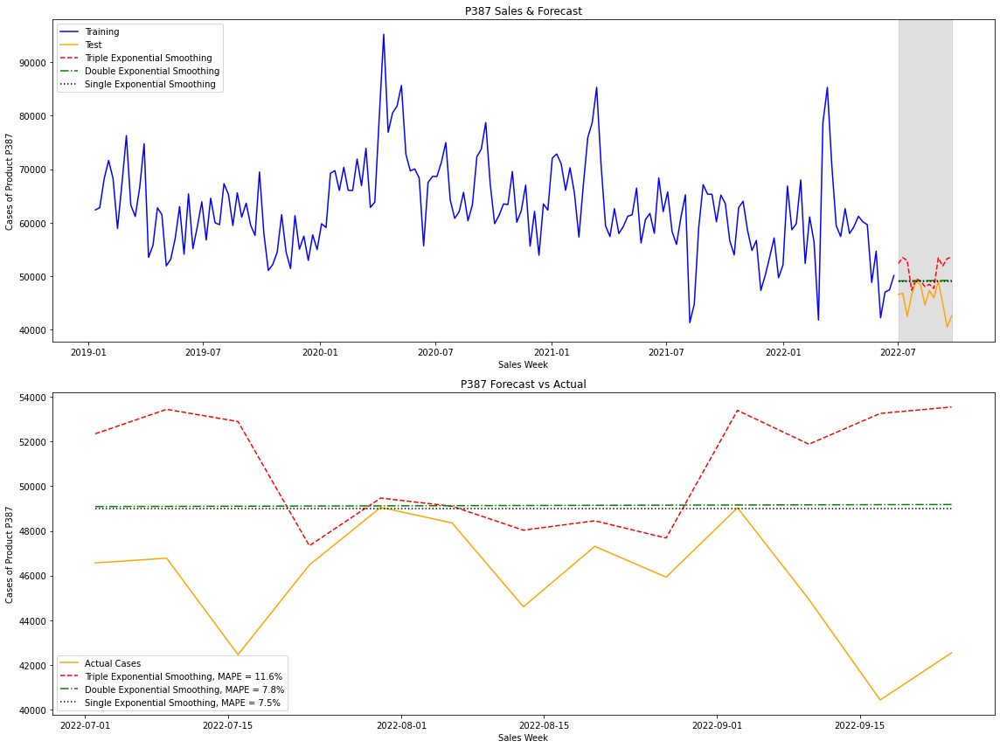

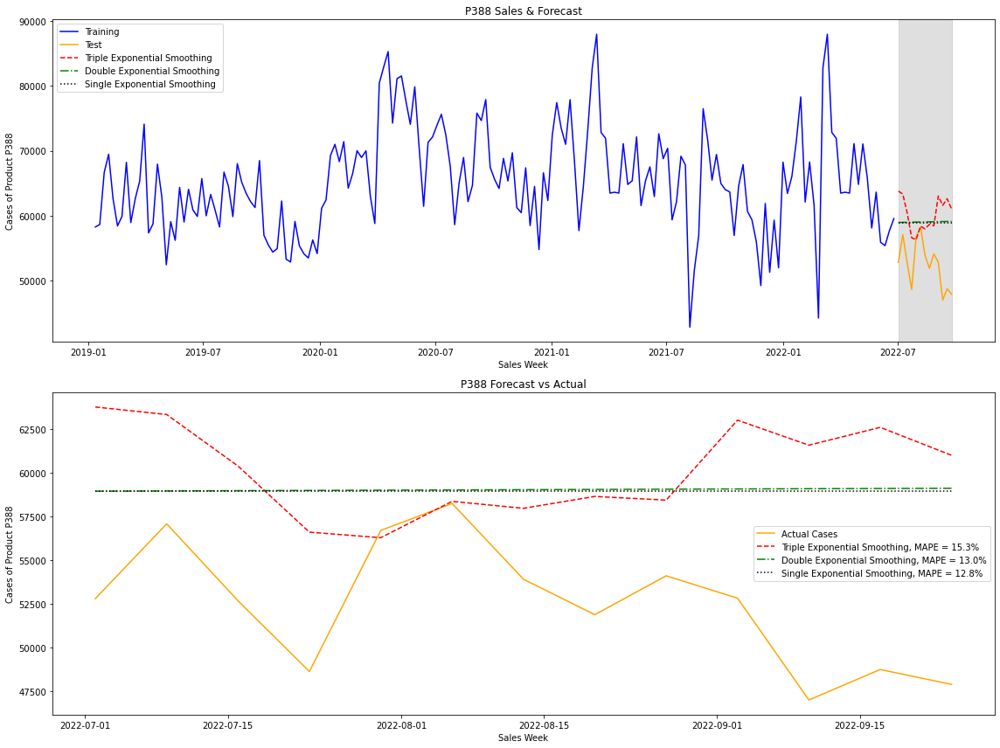

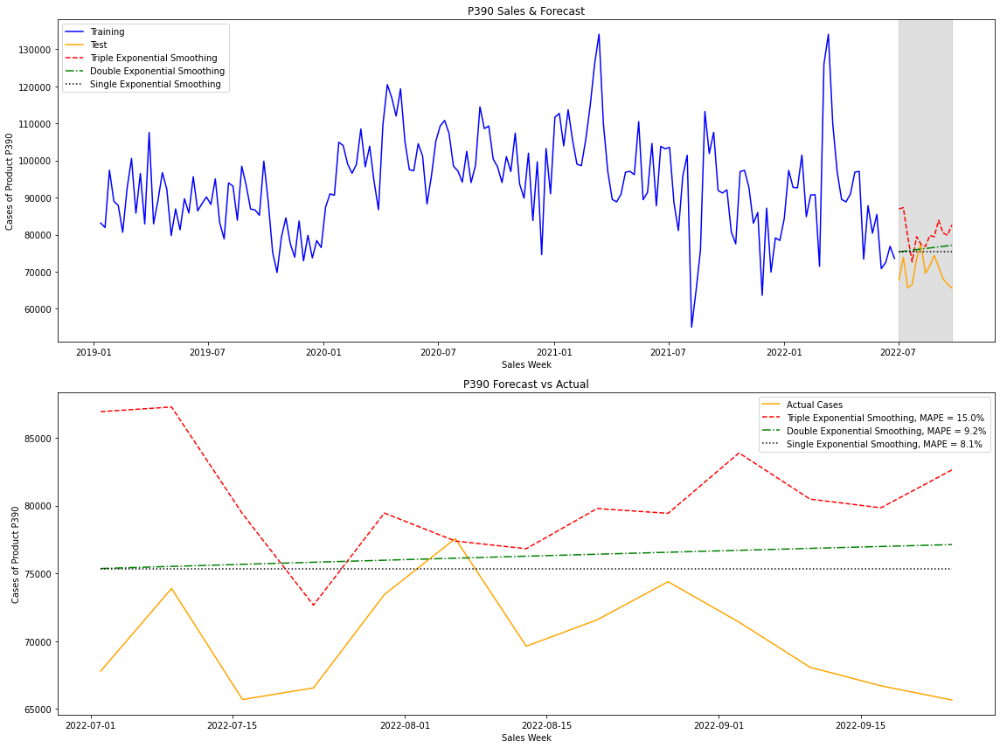

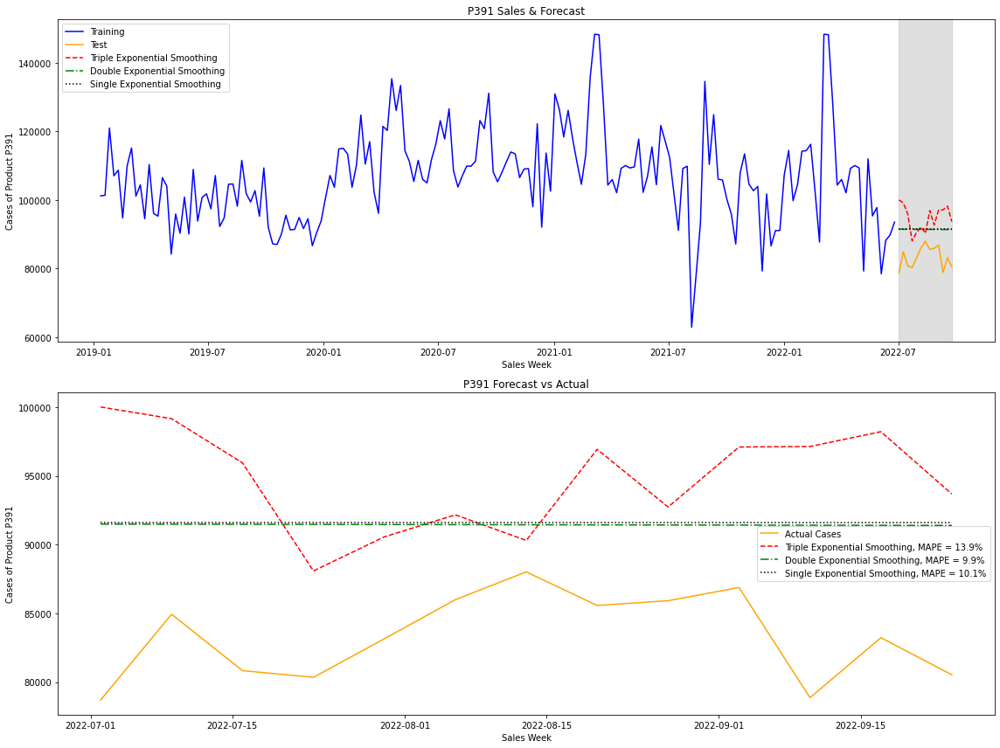

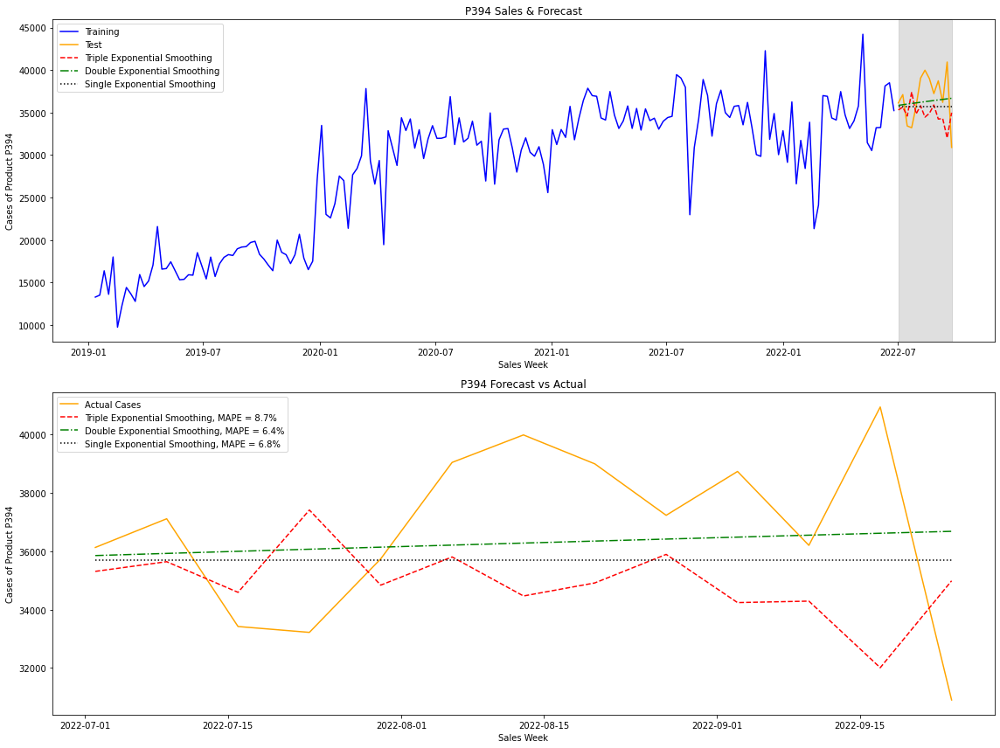

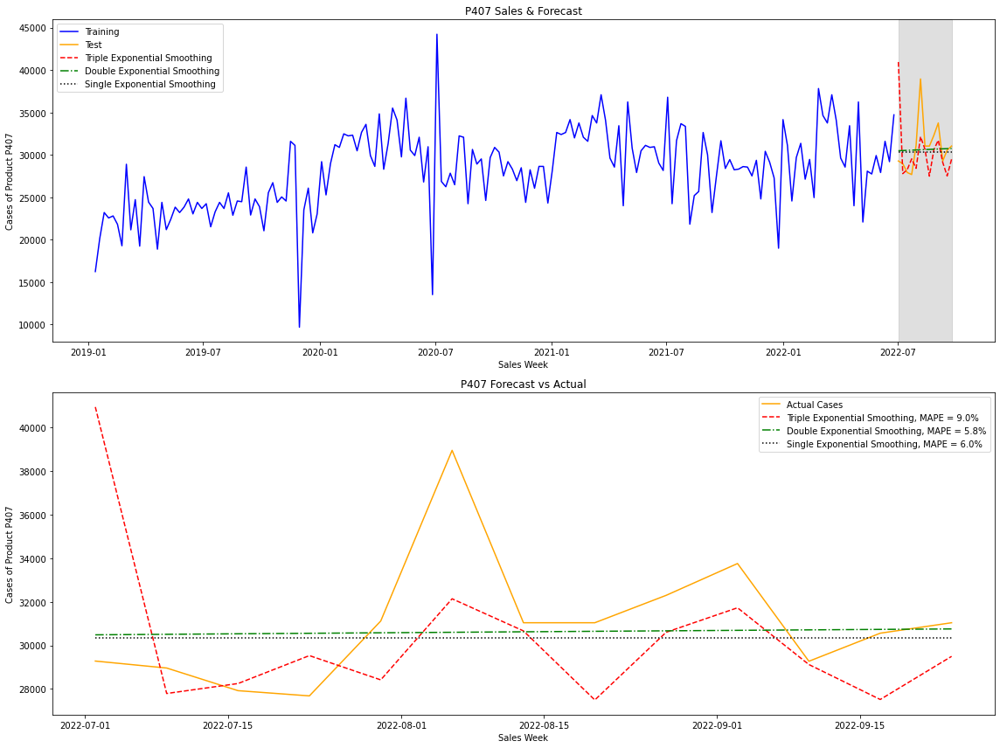

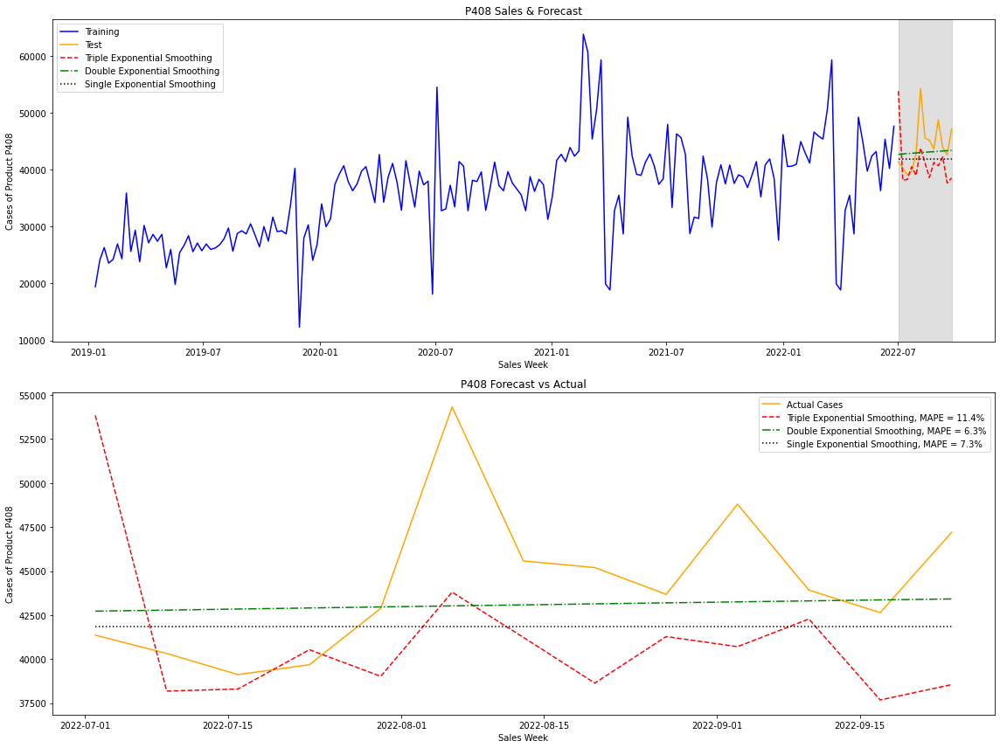

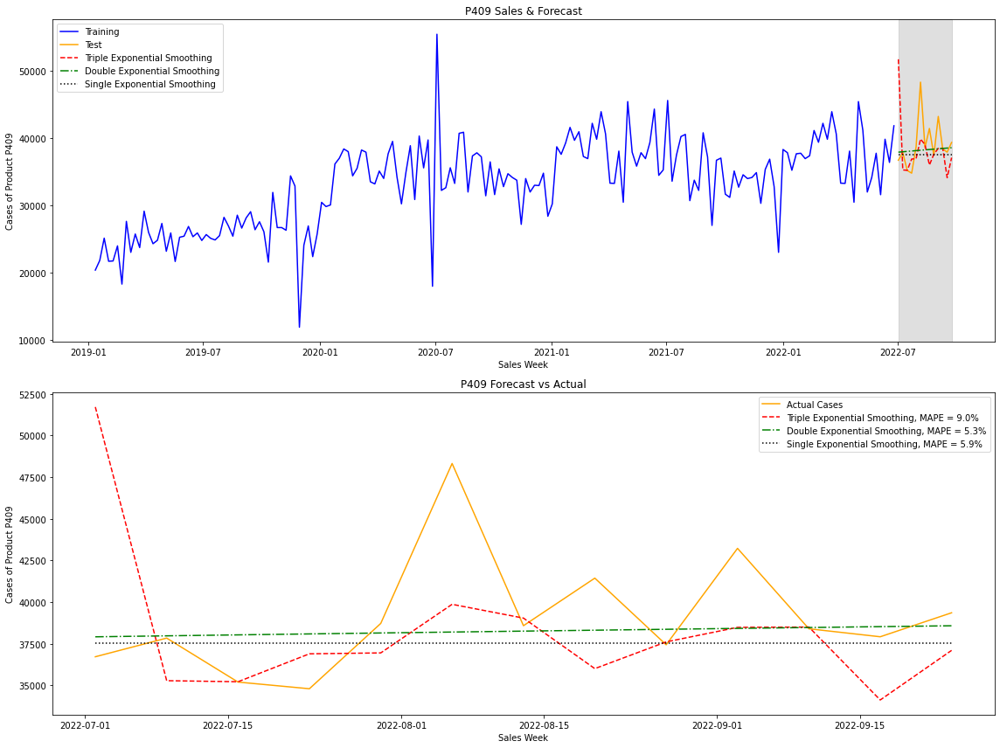

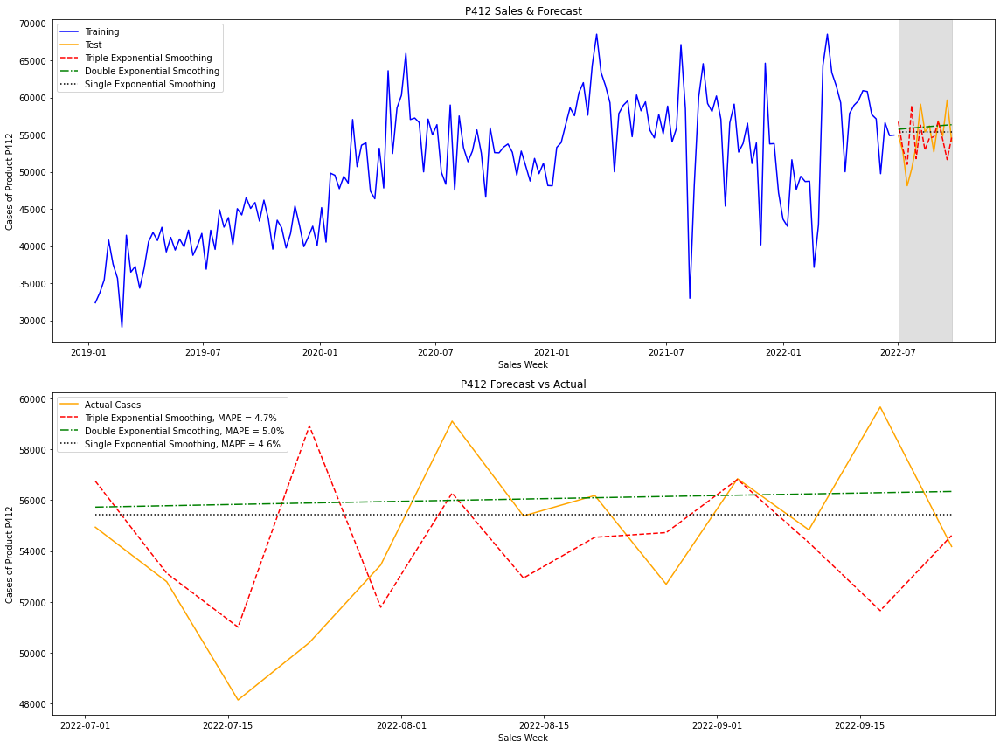

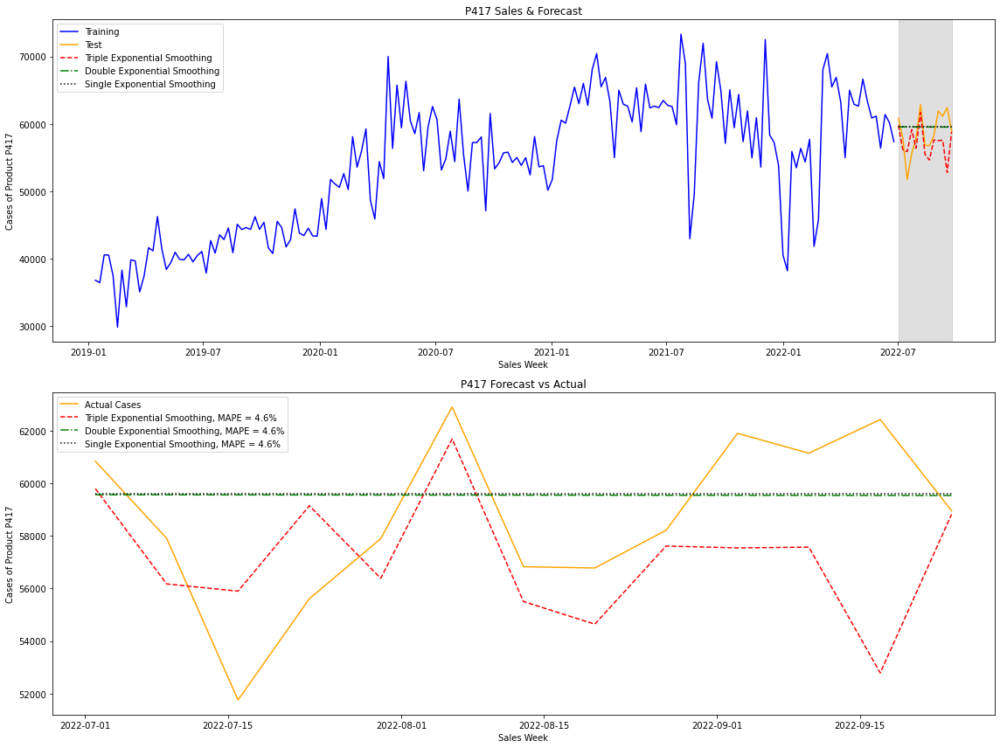

In [27]:
ax_train = s2_ax.iloc[:-13, :]
ax_test = s2_ax.iloc[-13:, :]

ax_results_rows = []
ax_param_rows = []

pred_ax2 = ax_test
for product in ax_train.columns:
    triple = ExponentialSmoothing(ax_train[product], trend="add", seasonal="add", seasonal_periods=52, freq = 'W-SAT', missing = 'drop', damped_trend=True, initialization_method = "estimated").fit()
    triple_label = product + "_triple"
    pred_ax2[triple_label] = triple.forecast(13)
    double = Holt(ax_train[product], exponential = False, damped_trend=True, initialization_method = "estimated").fit()
    double_label = product + "_double"
    pred_ax2[double_label] = double.forecast(13)    
    single = SimpleExpSmoothing(ax_train[product], initialization_method = "estimated").fit()
    single_label = product + "_single"
    pred_ax2[single_label] = single.forecast(13)
    
    #Make results tables
    triple_mape = mape(pred_ax2[product], pred_ax2[triple_label])
    triple_rmse = rmse(pred_ax2[product], pred_ax2[triple_label])
    triple_alpha = triple.params['smoothing_level']
    triple_beta = triple.params['smoothing_trend']
    triple_gamma = triple.params['smoothing_seasonal']
    triple_phi = triple.params['damping_trend']
    double_mape = mape(pred_ax2[product], pred_ax2[double_label])
    double_rmse = rmse(pred_ax2[product], pred_ax2[double_label])
    double_alpha = double.params['smoothing_level']
    double_beta = double.params['smoothing_trend']
    double_phi = double.params['damping_trend']
    single_mape = mape(pred_ax2[product], pred_ax2[single_label])
    single_rmse = rmse(pred_ax2[product], pred_ax2[single_label])
    single_alpha = single.params['smoothing_level']
    ax_results_rows.append([product, single_mape, double_mape, triple_mape])
    ax_param_rows.append([product, single_alpha, double_alpha, double_beta, double_phi, triple_alpha, triple_beta, triple_gamma, triple_phi])
    
    fig, (ax1,ax2) = plt.subplots(nrows = 2, ncols = 1, figsize = (16,12))
    ax1.plot(ax_train[product], label = 'Training', color = 'blue')
    ax1.plot(pred_ax2[product], label = 'Test', color = 'orange')
    ax1.plot(pred_ax2[triple_label], label = 'Triple Exponential Smoothing', color = 'red', linestyle = '--')
    ax1.plot(pred_ax2[double_label], label = 'Double Exponential Smoothing', color = 'green', linestyle = '-.')
    ax1.plot(pred_ax2[single_label], label = 'Single Exponential Smoothing', color = 'black', linestyle = ':')
    ax1.legend(loc = 'best')
    ax1.set_xlabel('Sales Week')
    ax1.set_ylabel('Cases of Product '+product)
    ax1.axvspan('2022-07-02', '2022-09-24', color = 'gray', alpha = 0.25)
    ax1.set_title(product + ' Sales & Forecast')
    
    ax2.plot(pred_ax2[product], label = "Actual Cases", color = 'orange')
    ax2.plot(pred_ax2[triple_label], label = f'Triple Exponential Smoothing, MAPE = {triple_mape}%', color = 'red', linestyle = '--')
    ax2.plot(pred_ax2[double_label], label = f'Double Exponential Smoothing, MAPE = {double_mape}%', color = 'green', linestyle = '-.')
    ax2.plot(pred_ax2[single_label], label = f'Single Exponential Smoothing, MAPE = {single_mape}%', color = 'black', linestyle = ':')
    ax2.legend(loc = 'best')
    ax2.set_xlabel('Sales Week')
    ax2.set_ylabel('Cases of Product '+product)
    ax2.set_title(product + ' Forecast vs Actual')
    #ax2.text(0.5, 0.05, f'Triple Exponential Smoothing MAPE for {product} is {triple_mape}%\nDouble Exponential Smoothing MAPE for {product} is {double_mape}%' ,
        #verticalalignment='bottom', horizontalalignment='center',
        #transform=ax2.transAxes,
        #color='black', fontsize=10)
    plt.tight_layout()
    smoothing_level = triple.params['smoothing_level']
    smoothing_trend = triple.params['smoothing_trend']
    smoothing_seasonal = triple.params['smoothing_seasonal']
ax_results = pd.DataFrame(ax_results_rows, columns = ['Product Code', 'MAPE - Single', 'MAPE - Double', 'MAPE - Triple'])
ax_params = pd.DataFrame(ax_param_rows, columns = ['Product Code', 'Alpha - Single', 'Alpha - Double', 'Beta - Double', 'Phi - Double', 'Alpha - Triple', 'Beta - Triple', 'Gamma - Triple', 'Phi - Triple'])

### Segment BX

C:\Users\Mike\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
<ipython-input-28-26600efd4b0a>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pred_bx2[triple_label] = triple.forecast(13)
C:\Users\Mike\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  warnings.warn('No frequency information was'
C:\Users\Mike\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
<ipython-input-28-26600efd4b0a>:14: SettingWithCopyWarning: 

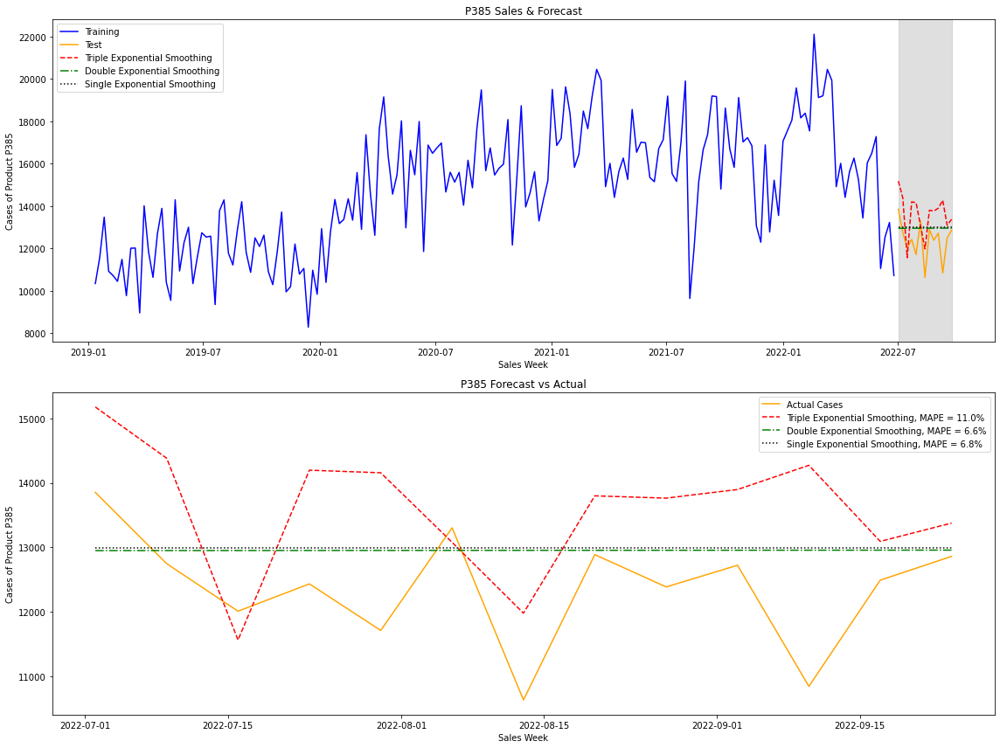

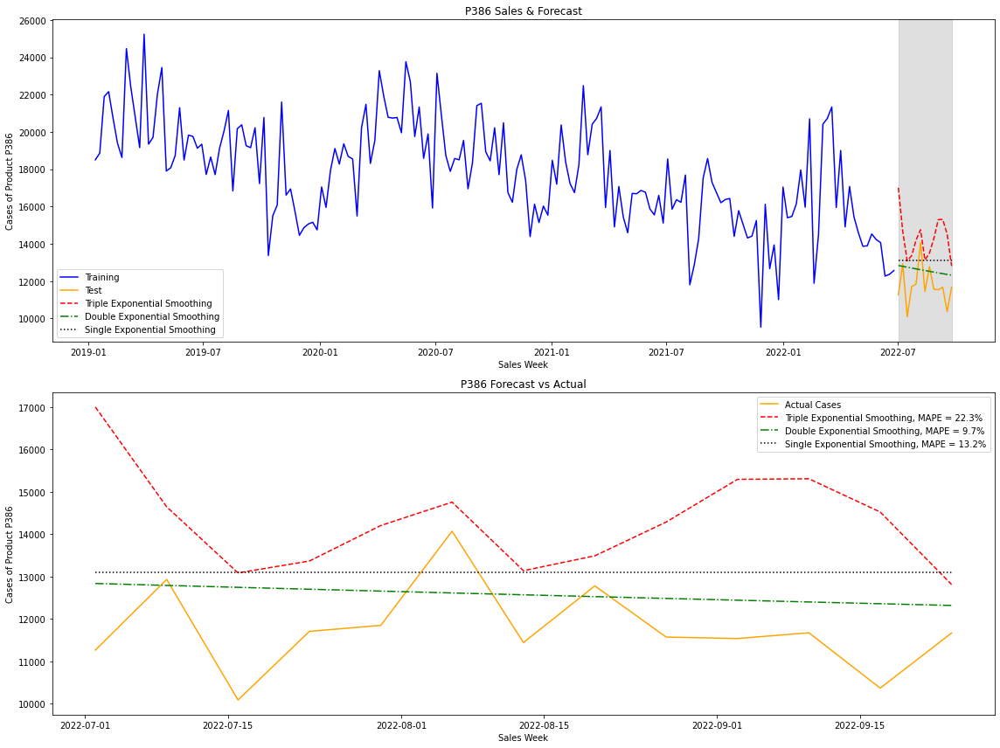

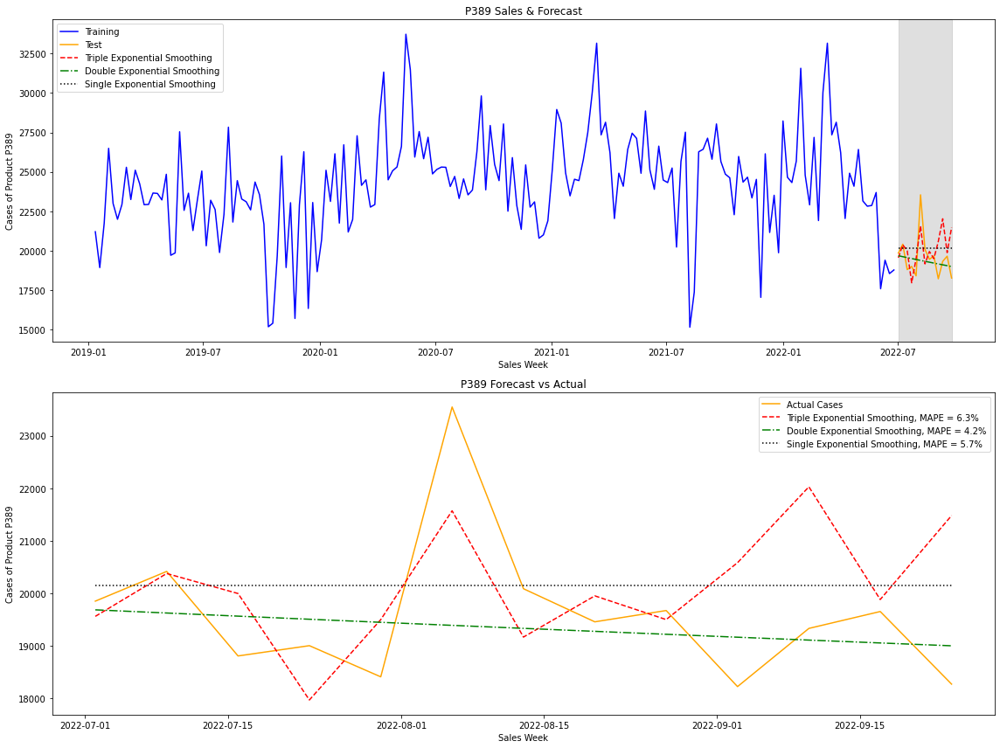

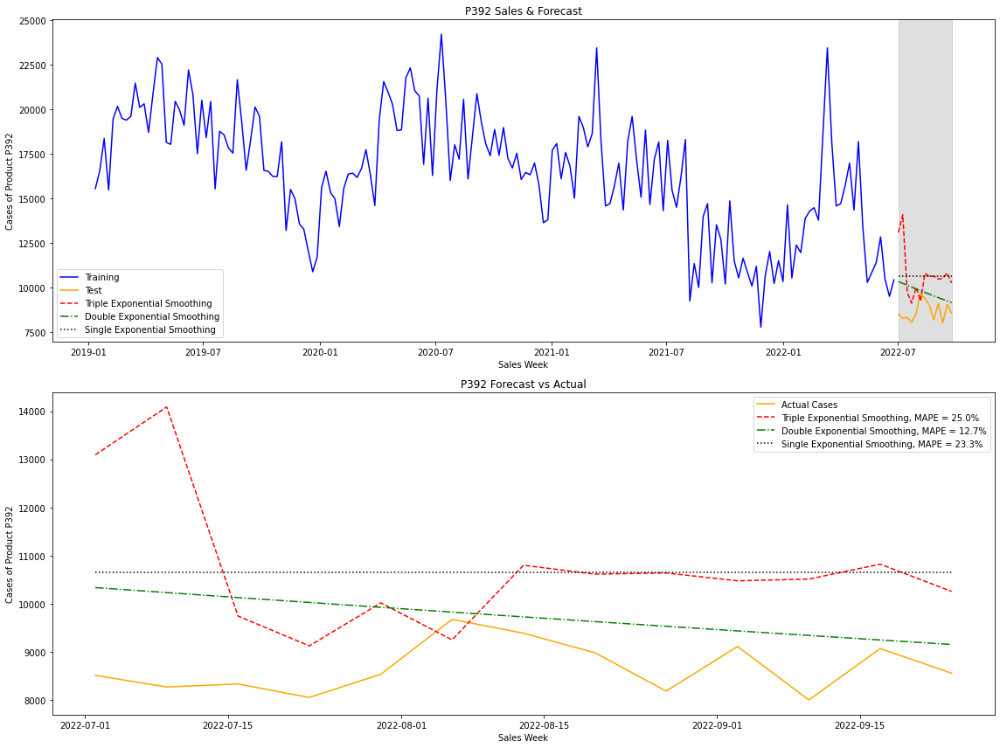

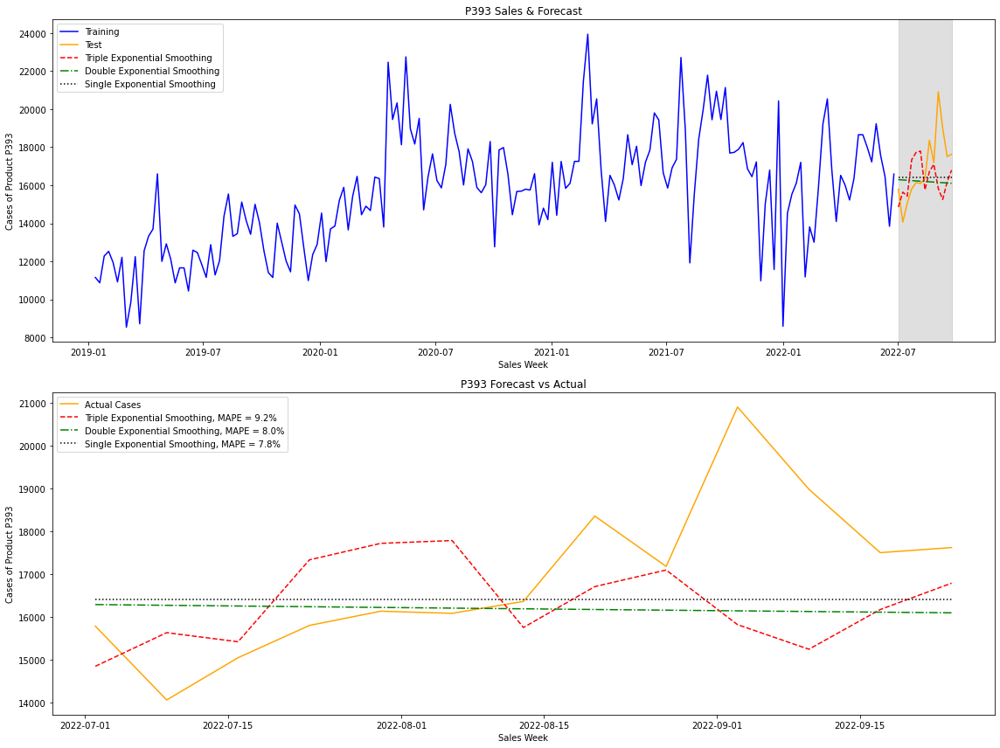

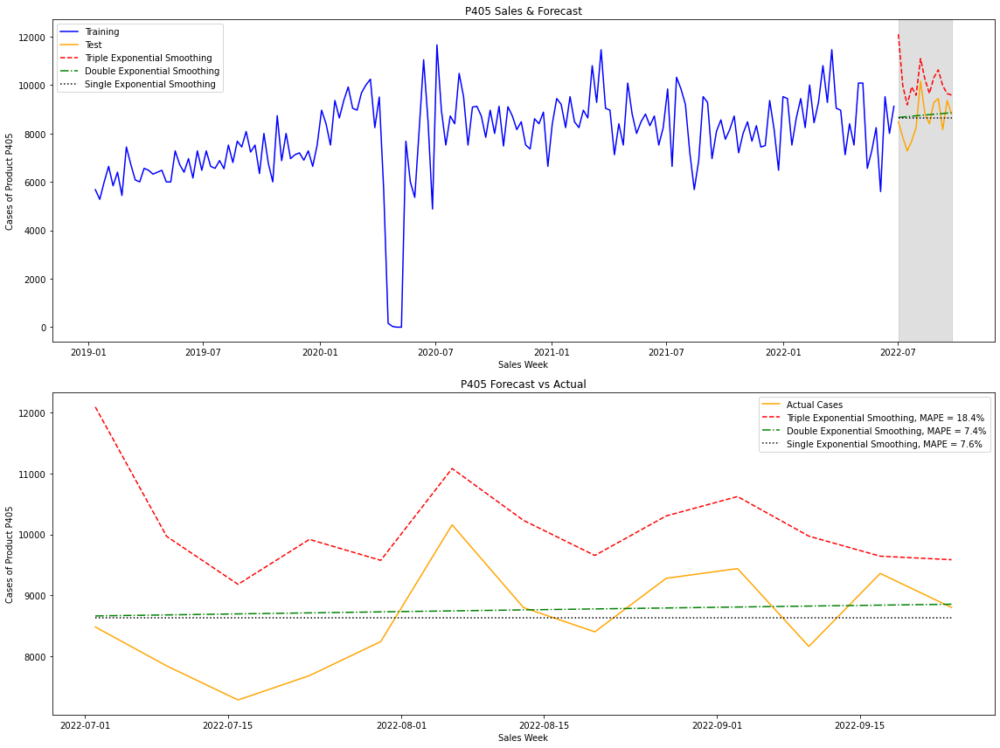

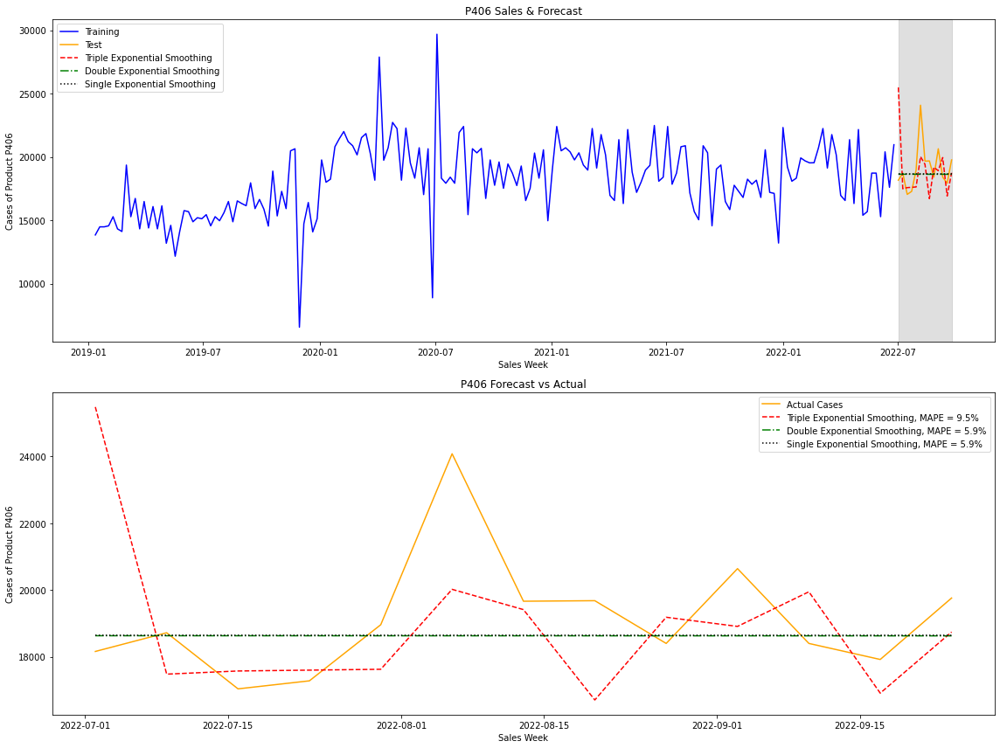

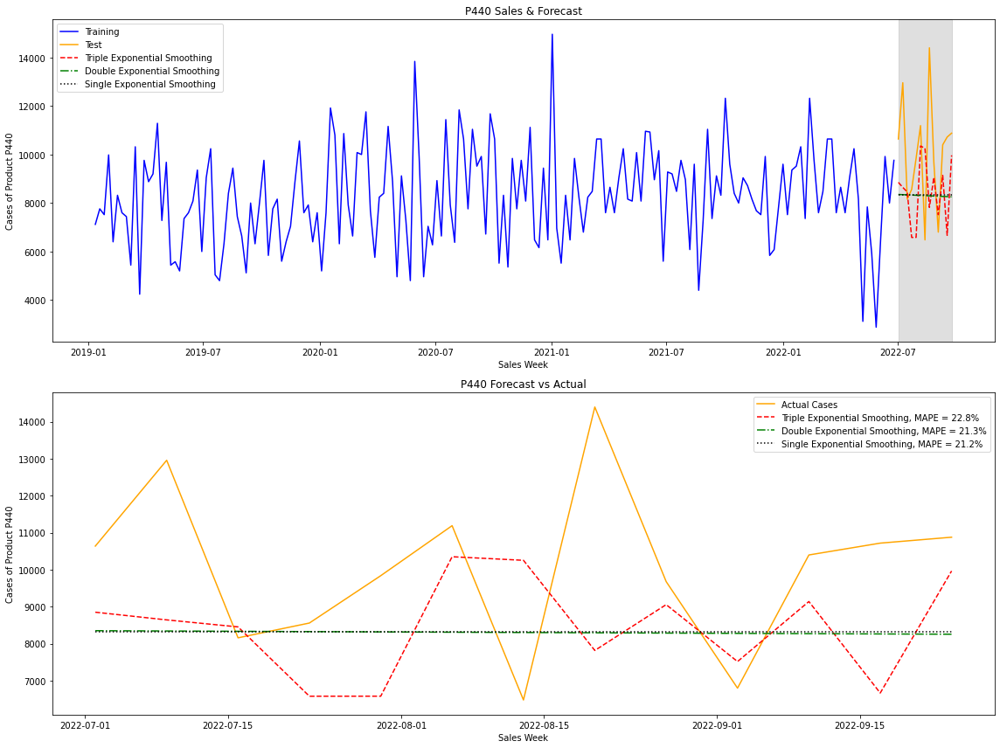

In [28]:
bx_train = s2_bx.iloc[:-13, :]
bx_test = s2_bx.iloc[-13:, :]

bx_results_rows = []
bx_param_rows = []

pred_bx2 = bx_test
for product in bx_train.columns:
    triple = ExponentialSmoothing(bx_train[product], trend="add", seasonal="add", seasonal_periods=52, freq = 'W-SAT', missing = 'drop', damped_trend=True, initialization_method = "estimated").fit()
    triple_label = product + "_triple"
    pred_bx2[triple_label] = triple.forecast(13)
    double = Holt(bx_train[product], exponential = False, damped_trend=True, initialization_method = "estimated").fit()
    double_label = product + "_double"
    pred_bx2[double_label] = double.forecast(13)    
    single = SimpleExpSmoothing(bx_train[product], initialization_method = "estimated").fit()
    single_label = product + "_single"
    pred_bx2[single_label] = single.forecast(13)
    
    #Make results tables
    triple_mape = mape(pred_bx2[product], pred_bx2[triple_label])
    triple_rmse = rmse(pred_bx2[product], pred_bx2[triple_label])
    triple_alpha = triple.params['smoothing_level']
    triple_beta = triple.params['smoothing_trend']
    triple_gamma = triple.params['smoothing_seasonal']
    triple_phi = triple.params['damping_trend']
    double_mape = mape(pred_bx2[product], pred_bx2[double_label])
    double_rmse = rmse(pred_bx2[product], pred_bx2[double_label])
    double_alpha = double.params['smoothing_level']
    double_beta = double.params['smoothing_trend']
    double_phi = double.params['damping_trend']
    single_mape = mape(pred_bx2[product], pred_bx2[single_label])
    single_rmse = rmse(pred_bx2[product], pred_bx2[single_label])
    single_alpha = single.params['smoothing_level']
    bx_results_rows.append([product, single_mape, double_mape, triple_mape])
    bx_param_rows.append([product, single_alpha, double_alpha, double_beta, double_phi, triple_alpha, triple_beta, triple_gamma, triple_phi])
    
    fig, (bx1,bx2) = plt.subplots(nrows = 2, ncols = 1, figsize = (16,12))
    bx1.plot(bx_train[product], label = 'Training', color = 'blue')
    bx1.plot(pred_bx2[product], label = 'Test', color = 'orange')
    bx1.plot(pred_bx2[triple_label], label = 'Triple Exponential Smoothing', color = 'red', linestyle = '--')
    bx1.plot(pred_bx2[double_label], label = 'Double Exponential Smoothing', color = 'green', linestyle = '-.')
    bx1.plot(pred_bx2[single_label], label = 'Single Exponential Smoothing', color = 'black', linestyle = ':')
    bx1.legend(loc = 'best')
    bx1.set_xlabel('Sales Week')
    bx1.set_ylabel('Cases of Product '+product)
    bx1.axvspan('2022-07-02', '2022-09-24', color = 'gray', alpha = 0.25)
    bx1.set_title(product + ' Sales & Forecast')
    
    bx2.plot(pred_bx2[product], label = "Actual Cases", color = 'orange')
    bx2.plot(pred_bx2[triple_label], label = f'Triple Exponential Smoothing, MAPE = {triple_mape}%', color = 'red', linestyle = '--')
    bx2.plot(pred_bx2[double_label], label = f'Double Exponential Smoothing, MAPE = {double_mape}%', color = 'green', linestyle = '-.')
    bx2.plot(pred_bx2[single_label], label = f'Single Exponential Smoothing, MAPE = {single_mape}%', color = 'black', linestyle = ':')
    bx2.legend(loc = 'best')
    bx2.set_xlabel('Sales Week')
    bx2.set_ylabel('Cases of Product '+product)
    bx2.set_title(product + ' Forecast vs Actual')
    #bx2.text(0.5, 0.05, f'Triple Exponential Smoothing MAPE for {product} is {triple_mape}%\nDouble Exponential Smoothing MAPE for {product} is {double_mape}%' ,
        #verticalalignment='bottom', horizontalalignment='center',
        #transform=bx2.transAxes,
        #color='black', fontsize=10)
    plt.tight_layout()
    smoothing_level = triple.params['smoothing_level']
    smoothing_trend = triple.params['smoothing_trend']
    smoothing_seasonal = triple.params['smoothing_seasonal']
bx_results = pd.DataFrame(bx_results_rows, columns = ['Product Code', 'MAPE - Single', 'MAPE - Double', 'MAPE - Triple'])
bx_params = pd.DataFrame(bx_param_rows, columns = ['Product Code', 'Alpha - Single', 'Alpha - Double', 'Beta - Double', 'Phi - Double', 'Alpha - Triple', 'Beta - Triple', 'Gamma - Triple', 'Phi - Triple'])

### Segment CX

C:\Users\Mike\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
<ipython-input-29-be6115694be4>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pred_cx2[triple_label] = triple.forecast(13)
C:\Users\Mike\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  warnings.warn('No frequency information was'
C:\Users\Mike\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
<ipython-input-29-be6115694be4>:14: SettingWithCopyWarning: 

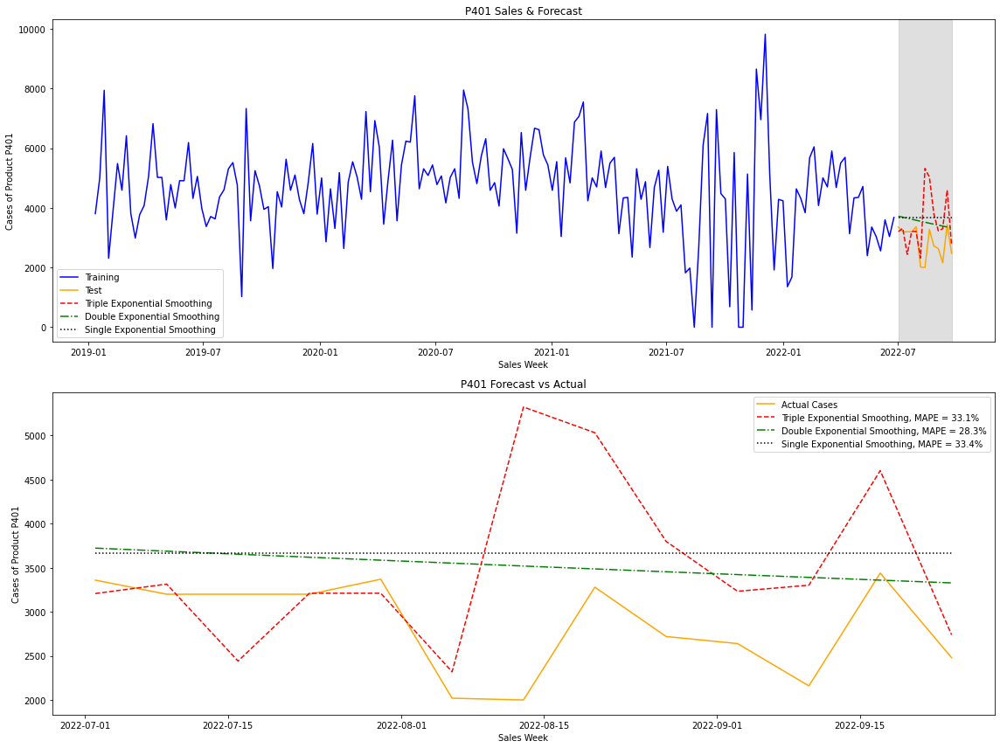

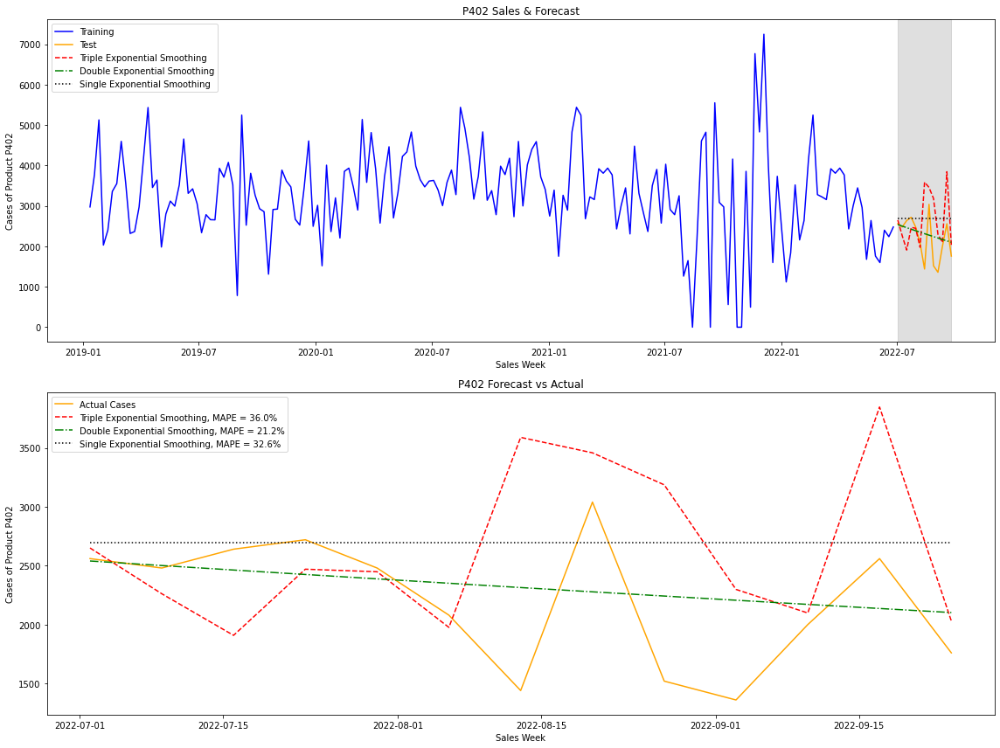

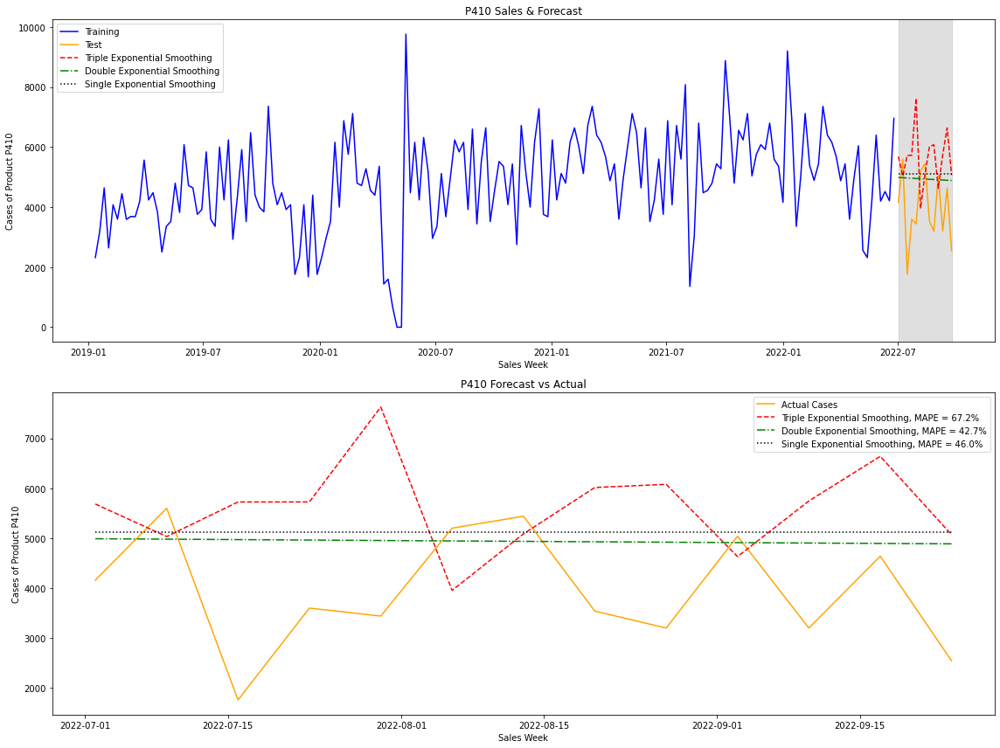

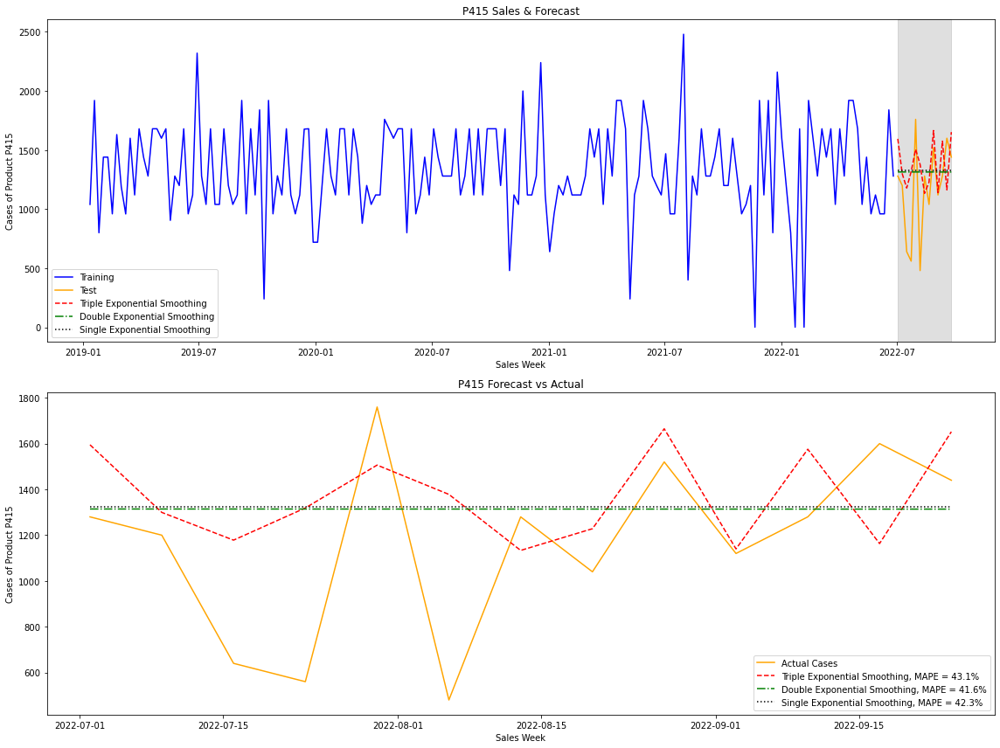

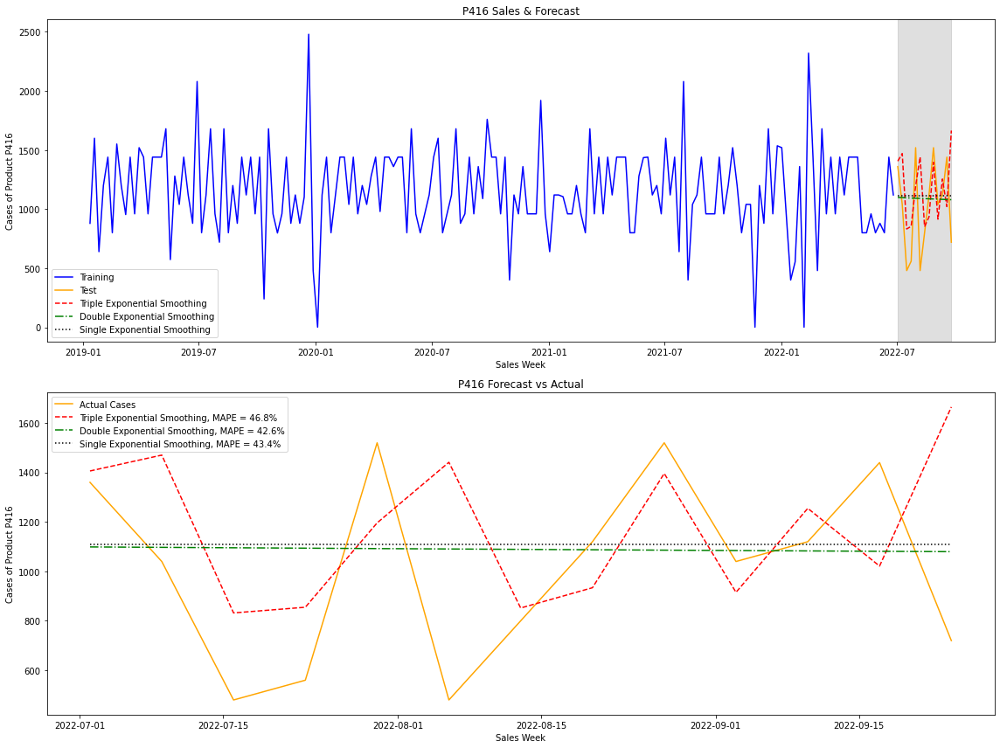

...

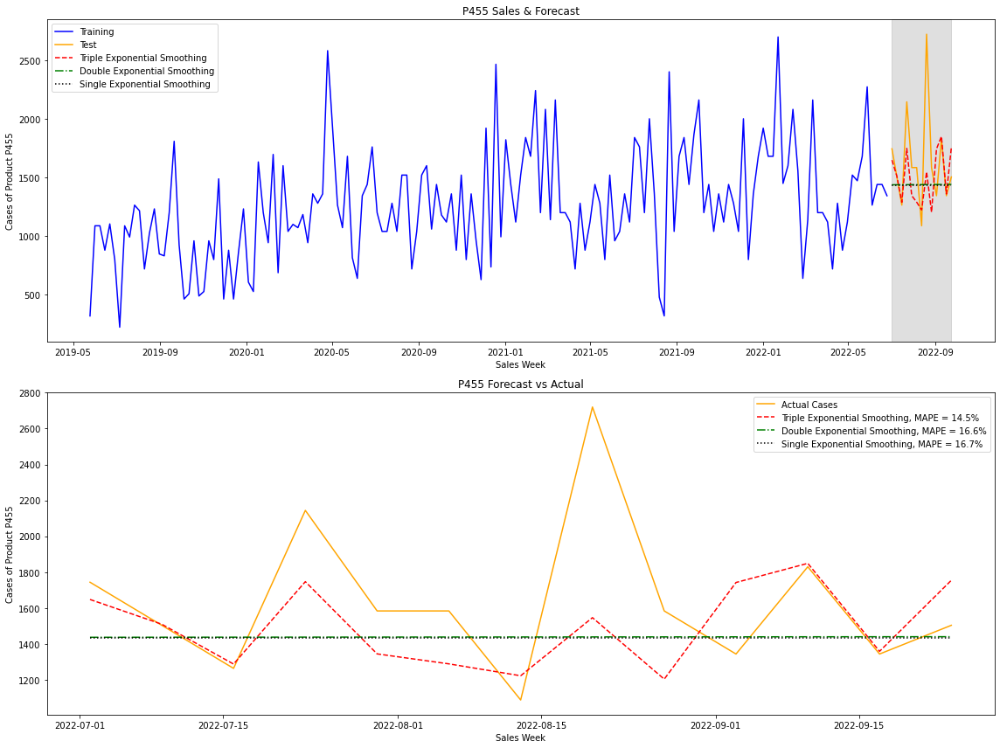

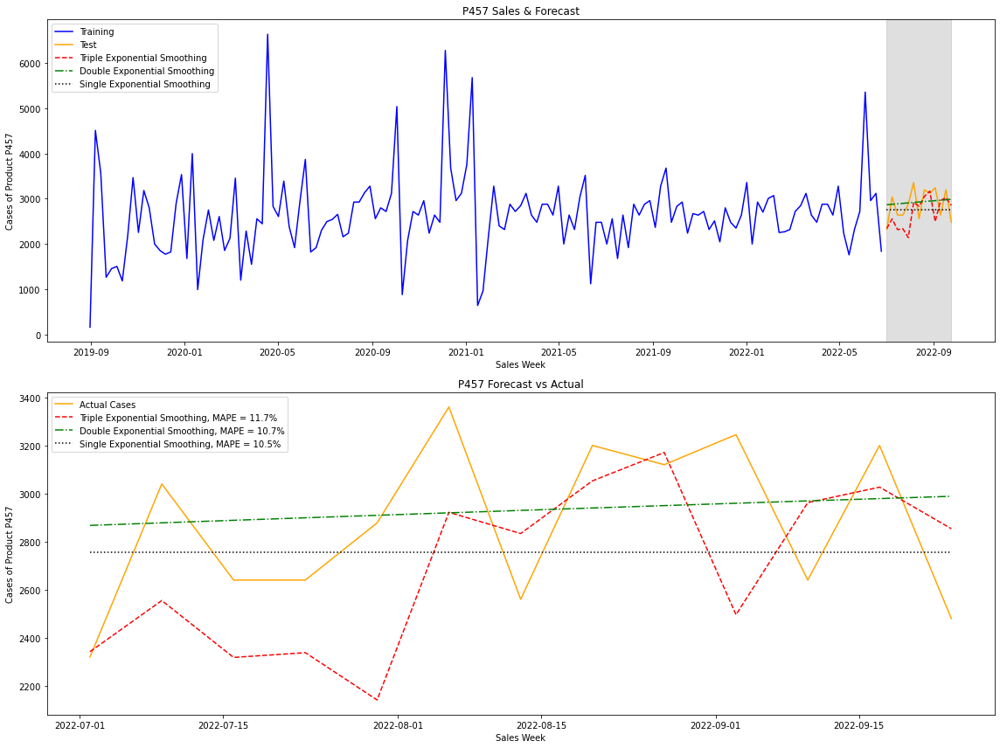

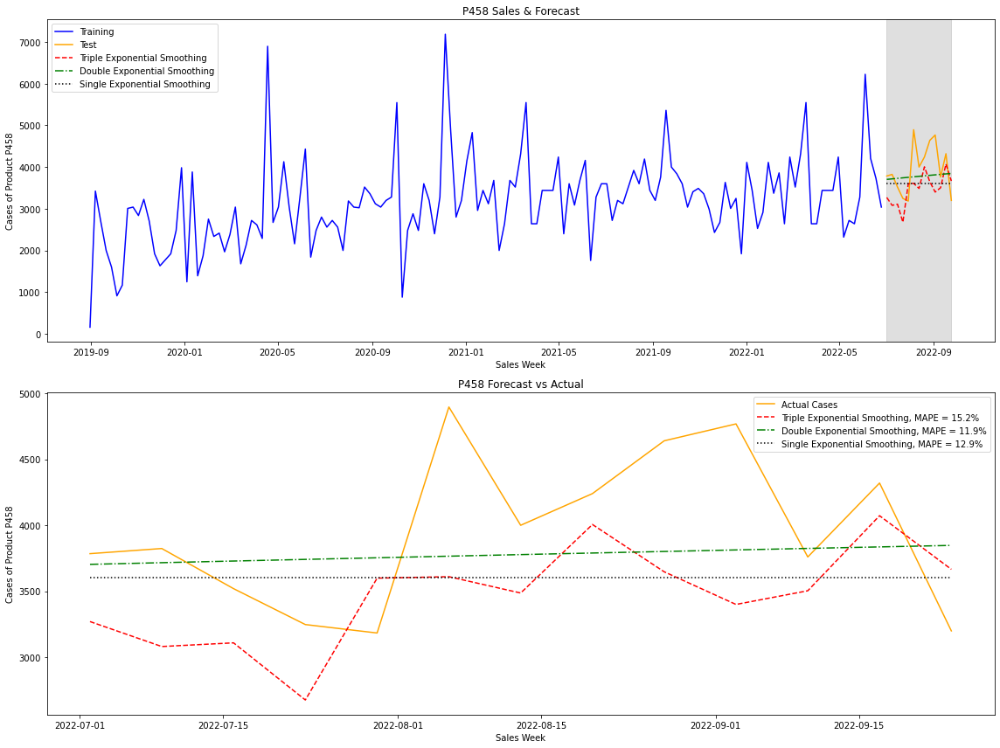

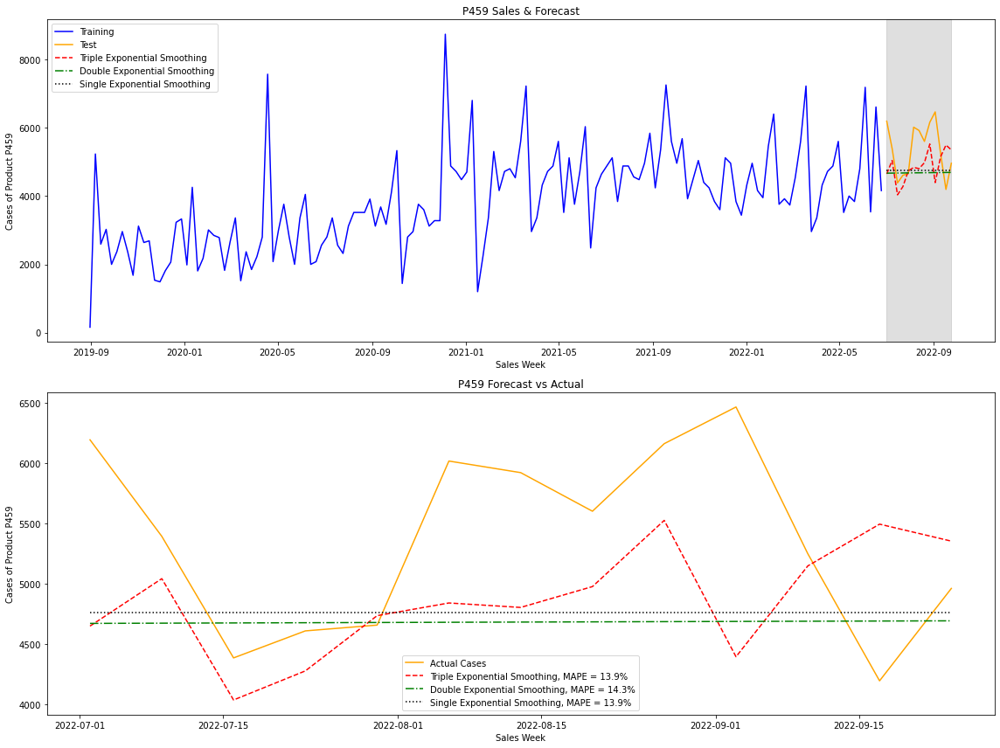

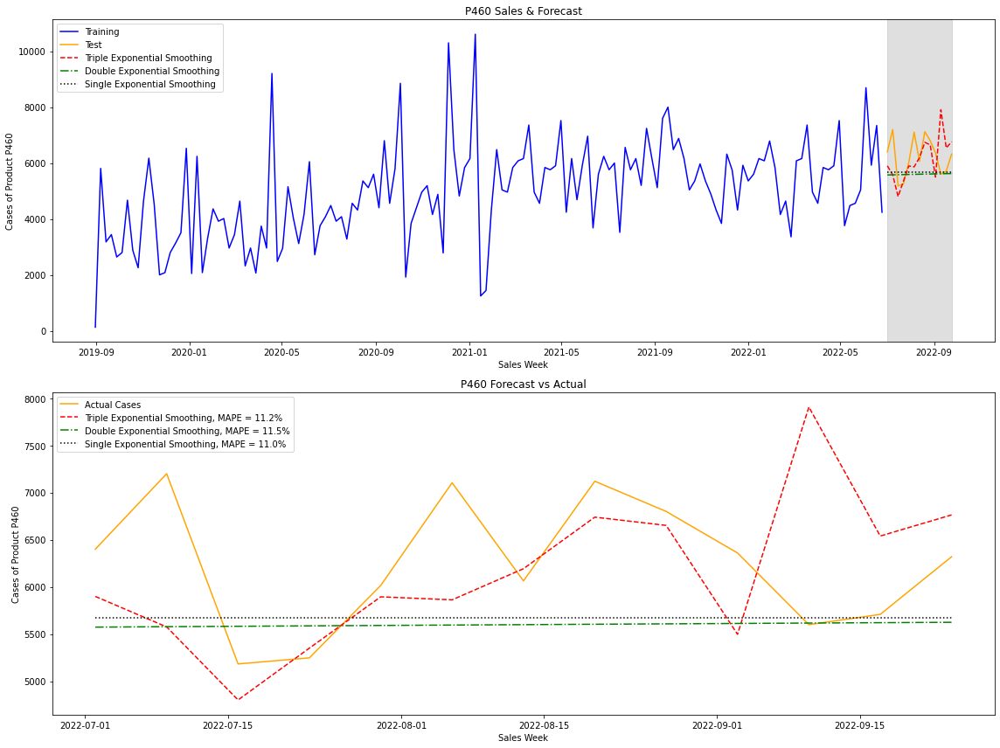

In [29]:
cx_train = s2_cx.iloc[:-13, :]
cx_test = s2_cx.iloc[-13:, :]

cx_results_rows = []
cx_param_rows = []

pred_cx2 = cx_test
for product in cx_train.columns:
    triple = ExponentialSmoothing(cx_train[product].iloc[40:], trend="add", seasonal="add", seasonal_periods=52, freq = 'W-SAT', missing = 'drop', damped_trend=True, initialization_method = "estimated").fit()
    triple_label = product + "_triple"
    pred_cx2[triple_label] = triple.forecast(13)
    double = Holt(cx_train[product].iloc[40:], exponential = False, damped_trend=True, initialization_method = "estimated").fit()
    double_label = product + "_double"
    pred_cx2[double_label] = double.forecast(13)    
    single = SimpleExpSmoothing(cx_train[product].iloc[40:], initialization_method = "estimated").fit()
    single_label = product + "_single"
    pred_cx2[single_label] = single.forecast(13)
    
    #Make results tables
    triple_mape = mape(pred_cx2[product], pred_cx2[triple_label])
    triple_rmse = rmse(pred_cx2[product], pred_cx2[triple_label])
    triple_alpha = triple.params['smoothing_level']
    triple_beta = triple.params['smoothing_trend']
    triple_gamma = triple.params['smoothing_seasonal']
    triple_phi = triple.params['damping_trend']
    double_mape = mape(pred_cx2[product], pred_cx2[double_label])
    double_rmse = rmse(pred_cx2[product], pred_cx2[double_label])
    double_alpha = double.params['smoothing_level']
    double_beta = double.params['smoothing_trend']
    double_phi = double.params['damping_trend']
    single_mape = mape(pred_cx2[product], pred_cx2[single_label])
    single_rmse = rmse(pred_cx2[product], pred_cx2[single_label])
    single_alpha = single.params['smoothing_level']
    cx_results_rows.append([product, single_mape, double_mape, triple_mape])
    cx_param_rows.append([product, single_alpha, double_alpha, double_beta, double_phi, triple_alpha, triple_beta, triple_gamma, triple_phi])
    
    fig, (cx1,cx2) = plt.subplots(nrows = 2, ncols = 1, figsize = (16,12))
    cx1.plot(cx_train[product], label = 'Training', color = 'blue')
    cx1.plot(pred_cx2[product], label = 'Test', color = 'orange')
    cx1.plot(pred_cx2[triple_label], label = 'Triple Exponential Smoothing', color = 'red', linestyle = '--')
    cx1.plot(pred_cx2[double_label], label = 'Double Exponential Smoothing', color = 'green', linestyle = '-.')
    cx1.plot(pred_cx2[single_label], label = 'Single Exponential Smoothing', color = 'black', linestyle = ':')
    cx1.legend(loc = 'best')
    cx1.set_xlabel('Sales Week')
    cx1.set_ylabel('Cases of Product '+product)
    cx1.axvspan('2022-07-02', '2022-09-24', color = 'gray', alpha = 0.25)
    cx1.set_title(product + ' Sales & Forecast')
    
    cx2.plot(pred_cx2[product], label = "Actual Cases", color = 'orange')
    cx2.plot(pred_cx2[triple_label], label = f'Triple Exponential Smoothing, MAPE = {triple_mape}%', color = 'red', linestyle = '--')
    cx2.plot(pred_cx2[double_label], label = f'Double Exponential Smoothing, MAPE = {double_mape}%', color = 'green', linestyle = '-.')
    cx2.plot(pred_cx2[single_label], label = f'Single Exponential Smoothing, MAPE = {single_mape}%', color = 'black', linestyle = ':')
    cx2.legend(loc = 'best')
    cx2.set_xlabel('Sales Week')
    cx2.set_ylabel('Cases of Product '+product)
    cx2.set_title(product + ' Forecast vs Actual')
    #cx2.text(0.5, 0.05, f'Triple Exponential Smoothing MAPE for {product} is {triple_mape}%\nDouble Exponential Smoothing MAPE for {product} is {double_mape}%' ,
        #verticalalignment='bottom', horizontalalignment='center',
        #transform=cx2.transAxes,
        #color='black', fontsize=10)
    plt.tight_layout()
    smoothing_level = triple.params['smoothing_level']
    smoothing_trend = triple.params['smoothing_trend']
    smoothing_seasonal = triple.params['smoothing_seasonal']
cx_results = pd.DataFrame(cx_results_rows, columns = ['Product Code', 'MAPE - Single', 'MAPE - Double', 'MAPE - Triple'])
cx_params = pd.DataFrame(cx_param_rows, columns = ['Product Code', 'Alpha - Single', 'Alpha - Double', 'Beta - Double', 'Phi - Double', 'Alpha - Triple', 'Beta - Triple', 'Gamma - Triple', 'Phi - Triple'])

### Segment CY

<ipython-input-30-d99ae18bd186>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pred_cy2[triple_label] = triple.forecast(13)
C:\Users\Mike\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  warnings.warn('No frequency information was'
<ipython-input-30-d99ae18bd186>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pred_cy2[double_label] = double.forecast(13)
C:\Users\Mike\anaconda3\lib\site-pa

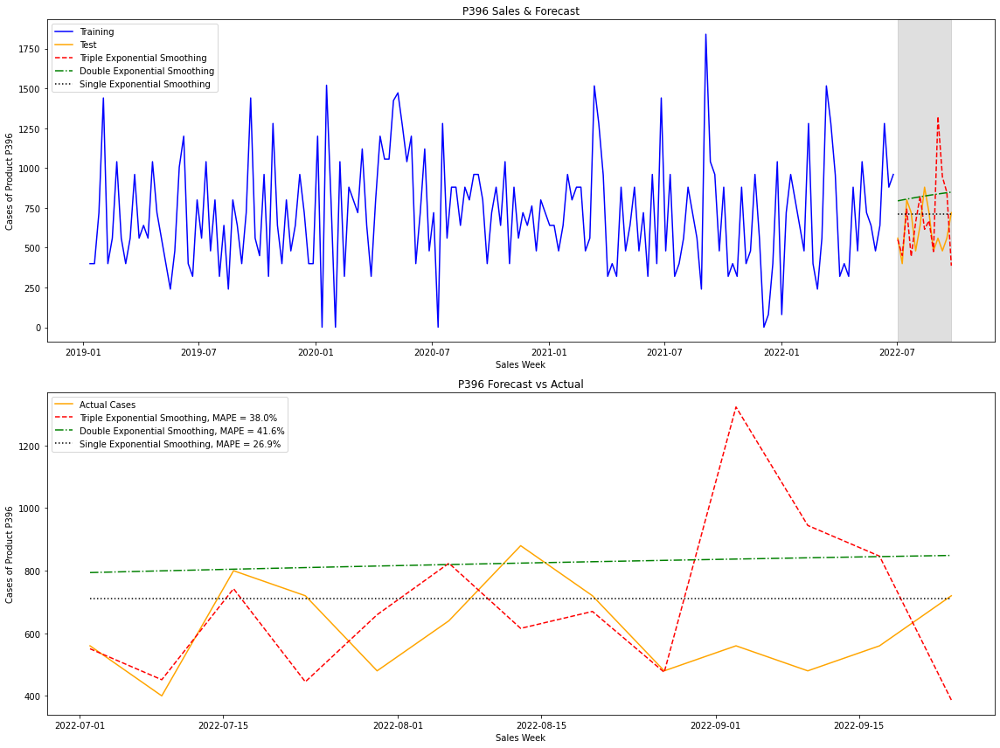

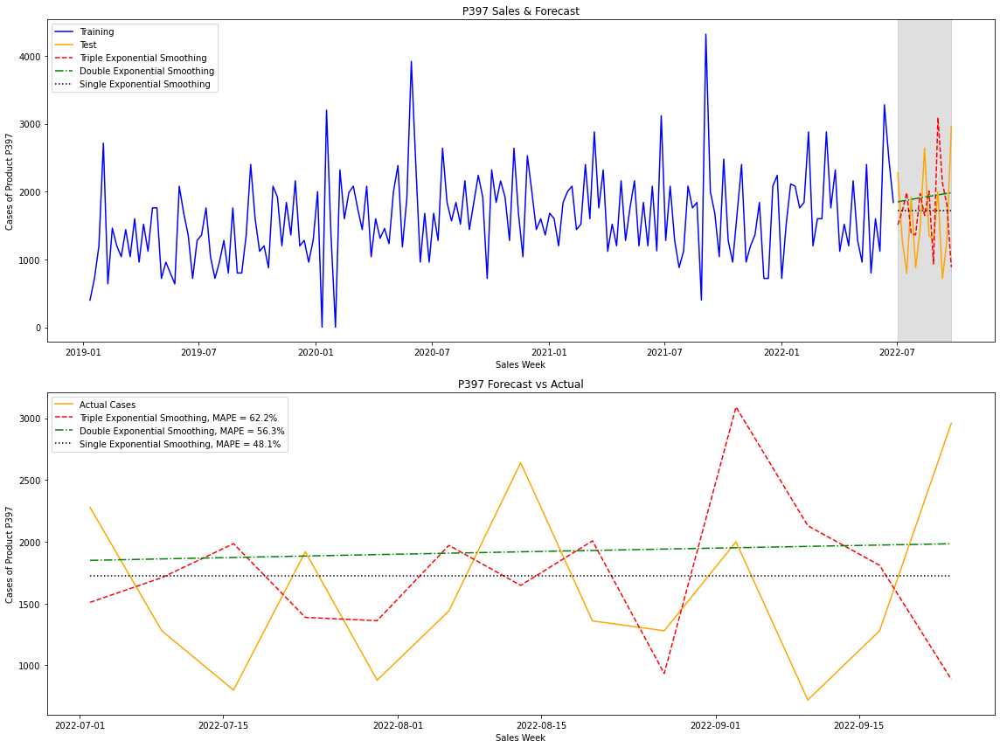

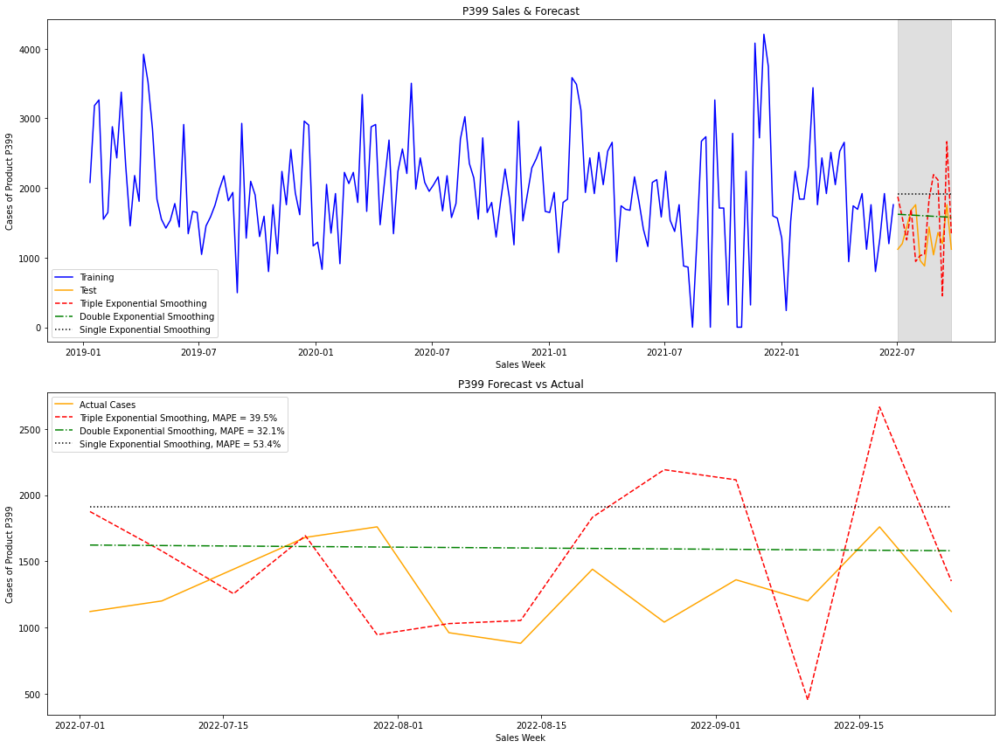

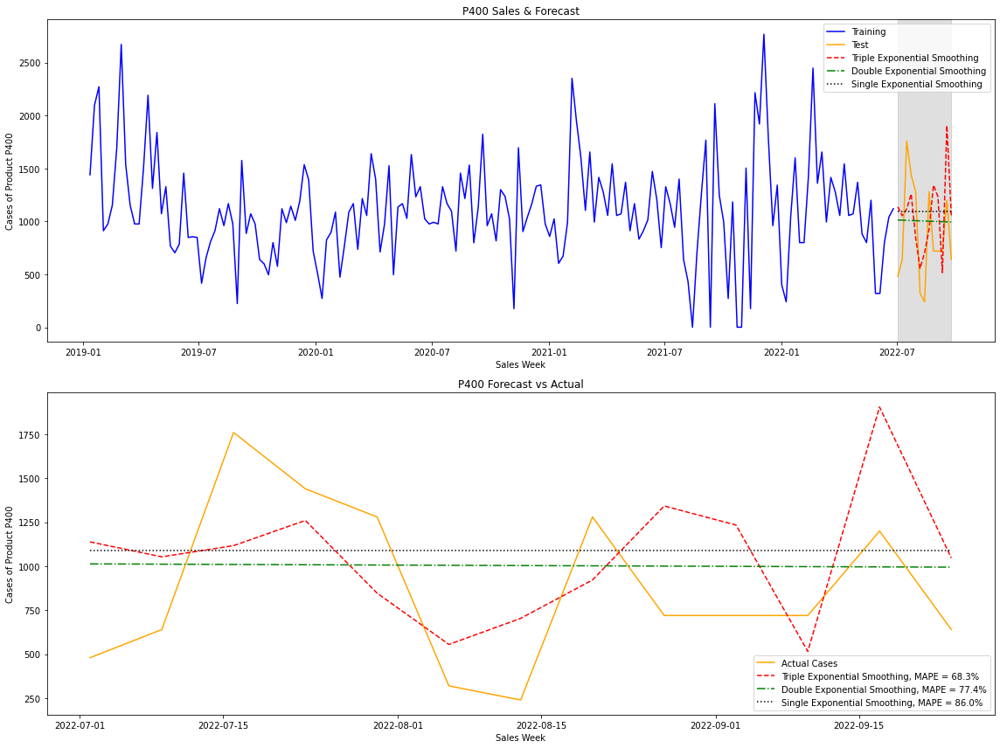

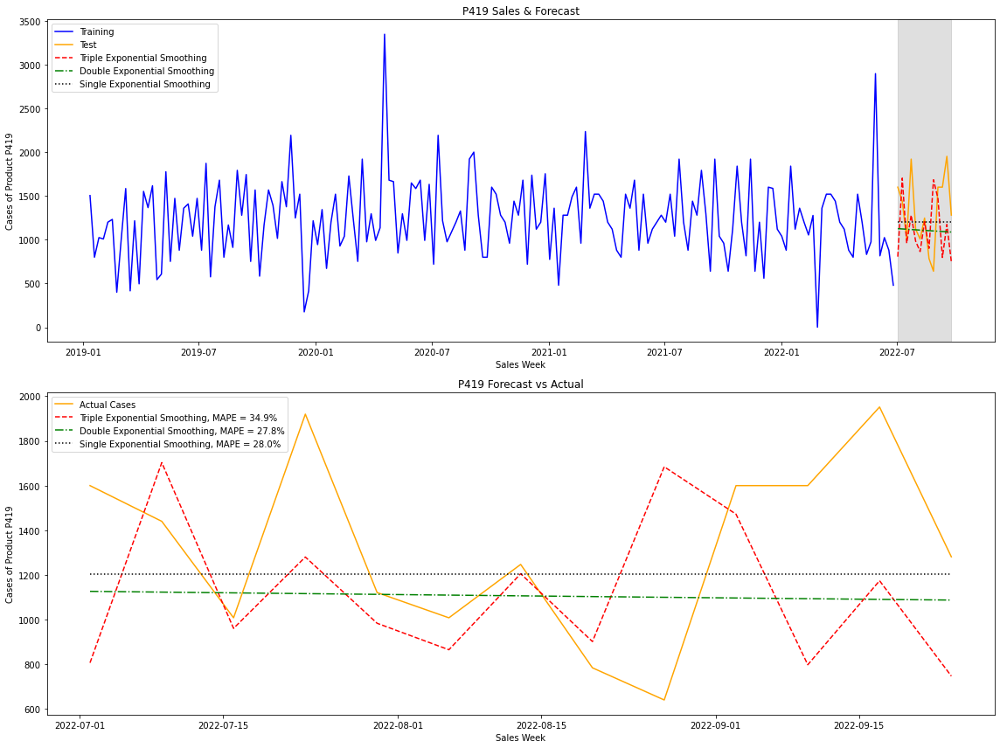

...

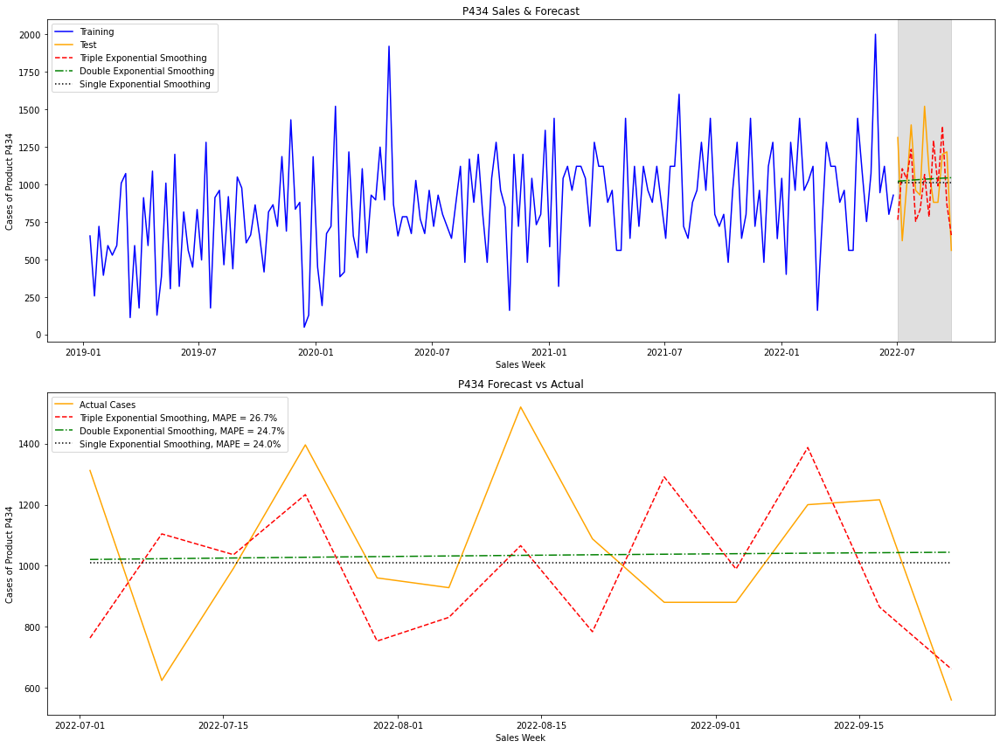

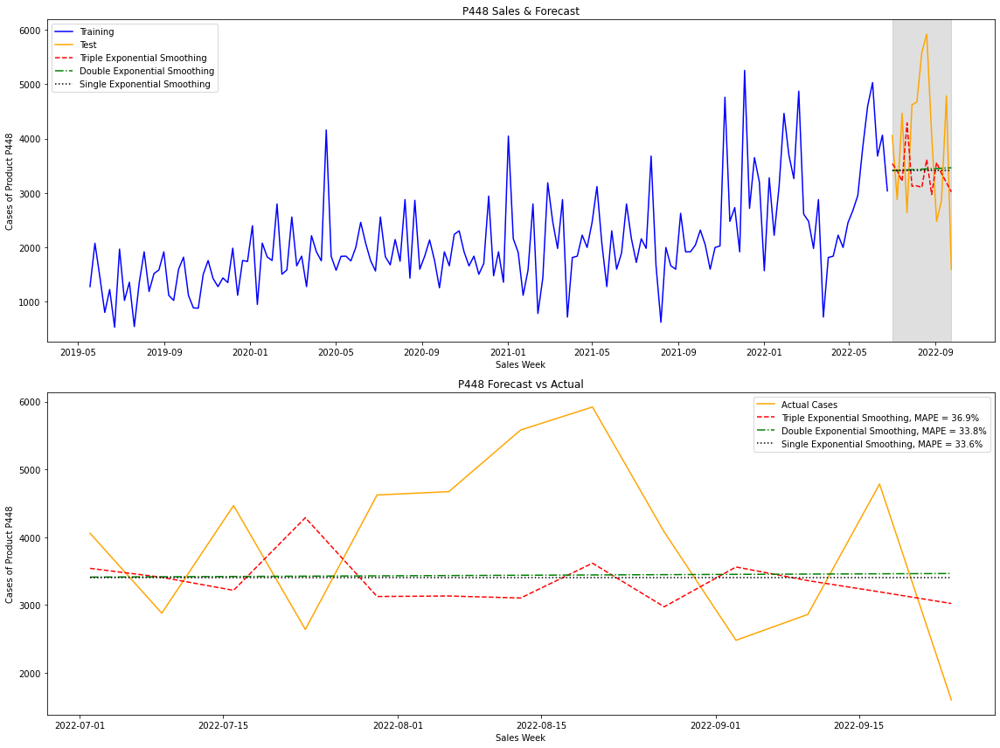

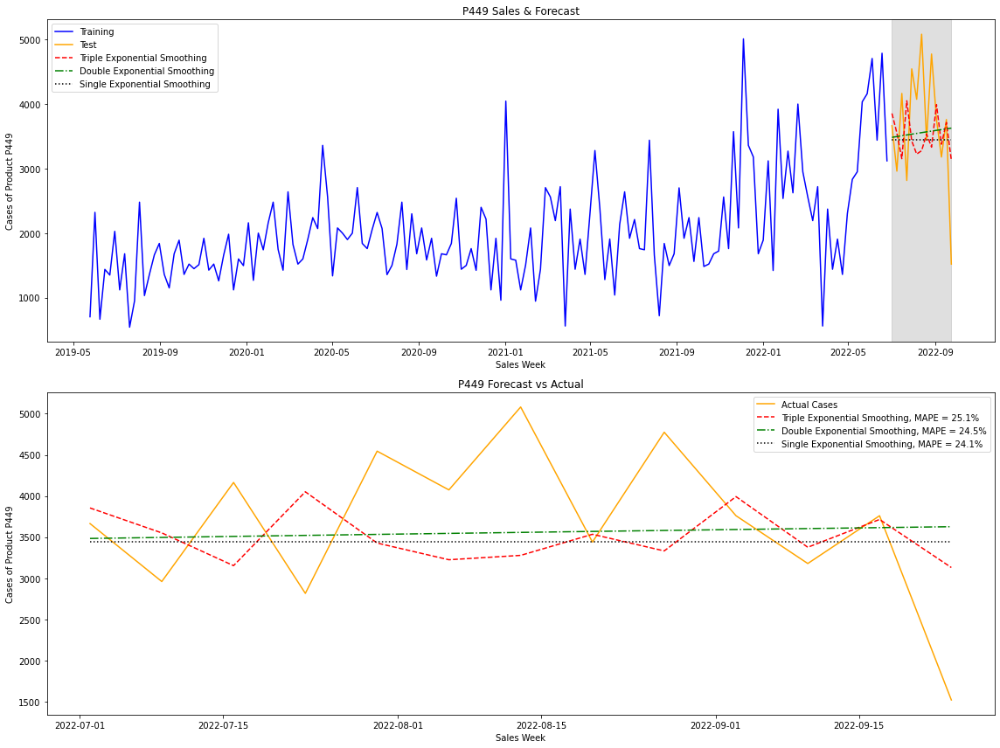

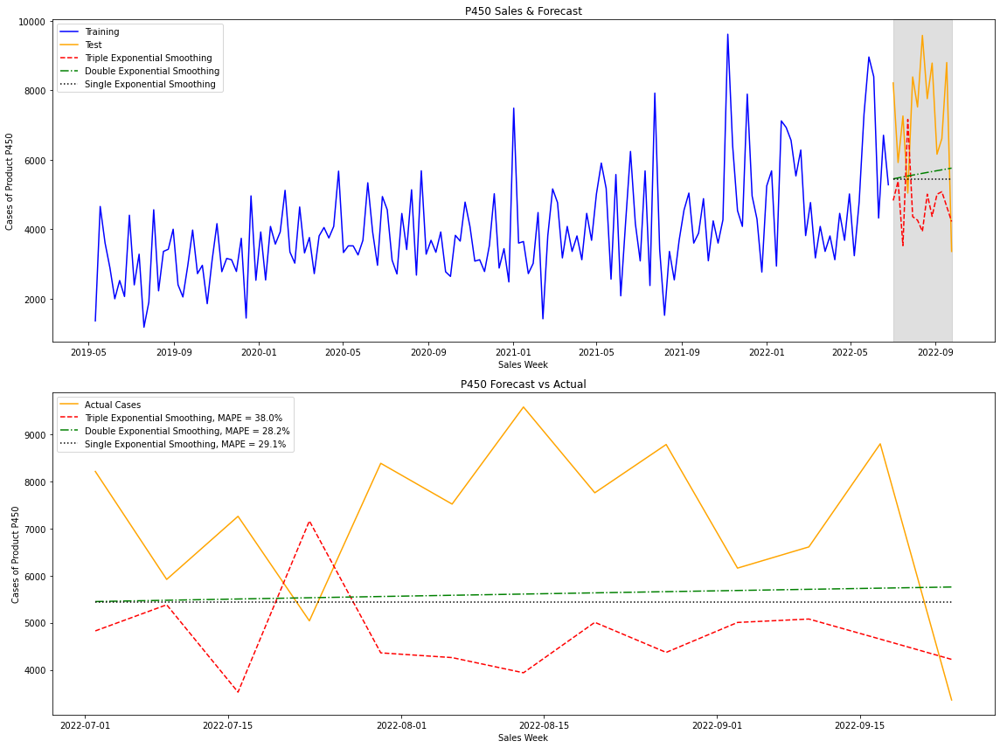

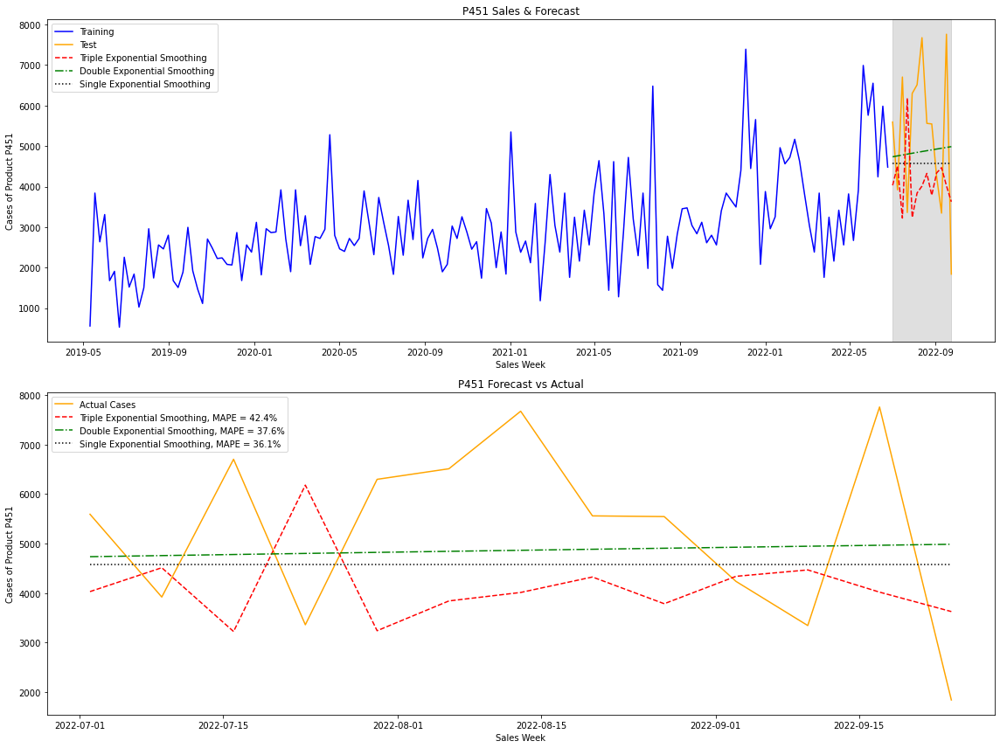

In [30]:
cy_train = s2_cy.iloc[:-13, :]
cy_test = s2_cy.iloc[-13:, :]

cy_results_rows = []
cy_param_rows = []

pred_cy2 = cy_test
for product in cy_train.columns:
    triple = ExponentialSmoothing(cy_train[product].iloc[20:], trend="add", seasonal="add", seasonal_periods=52, freq = 'W-SAT', missing = 'drop', damped_trend=True, initialization_method = "estimated").fit()
    triple_label = product + "_triple"
    pred_cy2[triple_label] = triple.forecast(13)
    double = Holt(cy_train[product].iloc[20:], exponential = False, damped_trend=True, initialization_method = "estimated").fit()
    double_label = product + "_double"
    pred_cy2[double_label] = double.forecast(13)    
    single = SimpleExpSmoothing(cy_train[product].iloc[20:], initialization_method = "estimated").fit()
    single_label = product + "_single"
    pred_cy2[single_label] = single.forecast(13)
    
    #Make results tables
    triple_mape = mape(pred_cy2[product], pred_cy2[triple_label])
    triple_rmse = rmse(pred_cy2[product], pred_cy2[triple_label])
    triple_alpha = triple.params['smoothing_level']
    triple_beta = triple.params['smoothing_trend']
    triple_gamma = triple.params['smoothing_seasonal']
    triple_phi = triple.params['damping_trend']
    double_mape = mape(pred_cy2[product], pred_cy2[double_label])
    double_rmse = rmse(pred_cy2[product], pred_cy2[double_label])
    double_alpha = double.params['smoothing_level']
    double_beta = double.params['smoothing_trend']
    double_phi = double.params['damping_trend']
    single_mape = mape(pred_cy2[product], pred_cy2[single_label])
    single_rmse = rmse(pred_cy2[product], pred_cy2[single_label])
    single_alpha = single.params['smoothing_level']
    cy_results_rows.append([product, single_mape, double_mape, triple_mape])
    cy_param_rows.append([product, single_alpha, double_alpha, double_beta, double_phi, triple_alpha, triple_beta, triple_gamma, triple_phi])
    
    fig, (cy1,cy2) = plt.subplots(nrows = 2, ncols = 1, figsize = (16,12))
    cy1.plot(cy_train[product], label = 'Training', color = 'blue')
    cy1.plot(pred_cy2[product], label = 'Test', color = 'orange')
    cy1.plot(pred_cy2[triple_label], label = 'Triple Exponential Smoothing', color = 'red', linestyle = '--')
    cy1.plot(pred_cy2[double_label], label = 'Double Exponential Smoothing', color = 'green', linestyle = '-.')
    cy1.plot(pred_cy2[single_label], label = 'Single Exponential Smoothing', color = 'black', linestyle = ':')
    cy1.legend(loc = 'best')
    cy1.set_xlabel('Sales Week')
    cy1.set_ylabel('Cases of Product '+product)
    cy1.axvspan('2022-07-02', '2022-09-24', color = 'gray', alpha = 0.25)
    cy1.set_title(product + ' Sales & Forecast')
    
    cy2.plot(pred_cy2[product], label = "Actual Cases", color = 'orange')
    cy2.plot(pred_cy2[triple_label], label = f'Triple Exponential Smoothing, MAPE = {triple_mape}%', color = 'red', linestyle = '--')
    cy2.plot(pred_cy2[double_label], label = f'Double Exponential Smoothing, MAPE = {double_mape}%', color = 'green', linestyle = '-.')
    cy2.plot(pred_cy2[single_label], label = f'Single Exponential Smoothing, MAPE = {single_mape}%', color = 'black', linestyle = ':')
    cy2.legend(loc = 'best')
    cy2.set_xlabel('Sales Week')
    cy2.set_ylabel('Cases of Product '+product)
    cy2.set_title(product + ' Forecast vs Actual')
    #cy2.text(0.5, 0.05, f'Triple Exponential Smoothing MAPE for {product} is {triple_mape}%\nDouble Exponential Smoothing MAPE for {product} is {double_mape}%' ,
        #verticalalignment='bottom', horizontalalignment='center',
        #transform=cy2.transAxes,
        #color='black', fontsize=10)
    plt.tight_layout()
    smoothing_level = triple.params['smoothing_level']
    smoothing_trend = triple.params['smoothing_trend']
    smoothing_seasonal = triple.params['smoothing_seasonal']
cy_results = pd.DataFrame(cy_results_rows, columns = ['Product Code', 'MAPE - Single', 'MAPE - Double', 'MAPE - Triple'])
cy_params = pd.DataFrame(cy_param_rows, columns = ['Product Code', 'Alpha - Single', 'Alpha - Double', 'Beta - Double', 'Phi - Double', 'Alpha - Triple', 'Beta - Triple', 'Gamma - Triple', 'Phi - Triple'])

### Segment CZ

In [ ]:
cz_train = s2_cz.iloc[:-13, :]
cz_test = s2_cz.iloc[-13:, :]

cz_results_rows = []
cz_param_rows = []

pred_cz2 = cz_test
for product in cz_train.columns:
    triple = ExponentialSmoothing(cz_train[product].iloc[40:], trend="add", seasonal="add", seasonal_periods=52, freq = 'W-SAT', missing = 'drop', damped_trend=True, initialization_method = "estimated").fit()
    triple_label = product + "_triple"
    pred_cz2[triple_label] = triple.forecast(13)
    double = Holt(cz_train[product].iloc[40:], exponential = False, damped_trend=True, initialization_method = "estimated").fit()
    double_label = product + "_double"
    pred_cz2[double_label] = double.forecast(13)    
    single = SimpleExpSmoothing(cz_train[product].iloc[40:], initialization_method = "estimated").fit()
    single_label = product + "_single"
    pred_cz2[single_label] = single.forecast(13)
    
    #Make results tables
    triple_mape = mape(pred_cz2[product], pred_cz2[triple_label])
    triple_rmse = rmse(pred_cz2[product], pred_cz2[triple_label])
    triple_alpha = triple.params['smoothing_level']
    triple_beta = triple.params['smoothing_trend']
    triple_gamma = triple.params['smoothing_seasonal']
    triple_phi = triple.params['damping_trend']
    double_mape = mape(pred_cz2[product], pred_cz2[double_label])
    double_rmse = rmse(pred_cz2[product], pred_cz2[double_label])
    double_alpha = double.params['smoothing_level']
    double_beta = double.params['smoothing_trend']
    double_phi = double.params['damping_trend']
    single_mape = mape(pred_cz2[product], pred_cz2[single_label])
    single_rmse = rmse(pred_cz2[product], pred_cz2[single_label])
    single_alpha = single.params['smoothing_level']
    cz_results_rows.append([product, single_mape, double_mape, triple_mape])
    cz_param_rows.append([product, single_alpha, double_alpha, double_beta, double_phi, triple_alpha, triple_beta, triple_gamma, triple_phi])
    
    fig, (cz1,cz2) = plt.subplots(nrows = 2, ncols = 1, figsize = (16,12))
    cz1.plot(cz_train[product], label = 'Training', color = 'blue')
    cz1.plot(pred_cz2[product], label = 'Test', color = 'orange')
    cz1.plot(pred_cz2[triple_label], label = 'Triple Exponential Smoothing', color = 'red', linestyle = '--')
    cz1.plot(pred_cz2[double_label], label = 'Double Exponential Smoothing', color = 'green', linestyle = '-.')
    cz1.plot(pred_cz2[single_label], label = 'Single Exponential Smoothing', color = 'black', linestyle = ':')
    cz1.legend(loc = 'best')
    cz1.set_xlabel('Sales Week')
    cz1.set_ylabel('Cases of Product '+product)
    cz1.axvspan('2022-07-02', '2022-09-24', color = 'gray', alpha = 0.25)
    cz1.set_title(product + ' Sales & Forecast')
    
    cz2.plot(pred_cz2[product], label = "Actual Cases", color = 'orange')
    cz2.plot(pred_cz2[triple_label], label = f'Triple Exponential Smoothing, MAPE = {triple_mape}%', color = 'red', linestyle = '--')
    cz2.plot(pred_cz2[double_label], label = f'Double Exponential Smoothing, MAPE = {double_mape}%', color = 'green', linestyle = '-.')
    cz2.plot(pred_cz2[single_label], label = f'Single Exponential Smoothing, MAPE = {single_mape}%', color = 'black', linestyle = ':')
    cz2.legend(loc = 'best')
    cz2.set_xlabel('Sales Week')
    cz2.set_ylabel('Cases of Product '+product)
    cz2.set_title(product + ' Forecast vs Actual')
    #cz2.text(0.5, 0.05, f'Triple Exponential Smoothing MAPE for {product} is {triple_mape}%\nDouble Exponential Smoothing MAPE for {product} is {double_mape}%' ,
        #verticalalignment='bottom', horizontalalignment='center',
        #transform=cz2.transAxes,
        #color='black', fontsize=10)
    plt.tight_layout()
    smoothing_level = triple.params['smoothing_level']
    smoothing_trend = triple.params['smoothing_trend']
    smoothing_seasonal = triple.params['smoothing_seasonal']
    #print(f'For product {product}:\n Single Smoothing:\n  MAPE: {single_mape}%\n  RMSE: {single_rmse}\n Double Smoothing:\n  MAPE: {double_mape}%\n  RMSE: {double_rmse}\n Triple Smoothing:\n  MAPE: {triple_mape}%\n  RMSE: {triple_rmse}')
    #print(f'Alpha for {product} is {smoothing_level}')
    #print(f'Beta for {product} is {smoothing_trend}')
    #print(f'Gamma for {product} is {smoothing_seasonal}')
cz_results = pd.DataFrame(cz_results_rows, columns = ['Product Code', 'MAPE - Single', 'MAPE - Double', 'MAPE - Triple'])
cz_params = pd.DataFrame(cz_param_rows, columns = ['Product Code', 'Alpha - Single', 'Alpha - Double', 'Beta - Double', 'Phi - Double', 'Alpha - Triple', 'Beta - Triple', 'Gamma - Triple', 'Phi - Triple'])

<ipython-input-31-639d9f6b3068>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pred_cz2[triple_label] = triple.forecast(13)
C:\Users\Mike\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  warnings.warn('No frequency information was'
<ipython-input-31-639d9f6b3068>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pred_cz2[double_label] = double.forecast(13)
C:\Users\Mike\anaconda3\lib\site-pa

### Segment NP

In [ ]:
np_train = s2_np.iloc[:-13, :]
np_test = s2_np.iloc[-13:, :]

np_results_rows = []
np_param_rows = []

pred_np2 = np_test
for product in np_train.columns:
    #np_train[product] = np.where(np_train[product] < 1, 1, np_train[product])
    #np_train[product] = np_train[product].fillna(1)
    #triple = ExponentialSmoothing(np_train[product].iloc[158:], trend="add", seasonal="add", seasonal_periods=52, freq = 'W-SAT', missing = 'drop', damped_trend=True, initialization_method = "estimated").fit()
    #triple_label = product + "_triple"
    #pred_np2[triple_label] = triple.forecast(13)
    double = Holt(np_train[product].iloc[158:], exponential = False, damped_trend=True, initialization_method = "estimated").fit()
    double_label = product + "_double"
    pred_np2[double_label] = double.forecast(13)    
    single = SimpleExpSmoothing(np_train[product].iloc[158:], initialization_method = "estimated").fit()
    single_label = product + "_single"
    pred_np2[single_label] = single.forecast(13)
    
    #Make results tables
    #triple_mape = mape(pred_np2[product], pred_np2[triple_label])
    #triple_rmse = rmse(pred_np2[product], pred_np2[triple_label])
    #triple_alpha = triple.params['smoothing_level']
    #triple_beta = triple.params['smoothing_trend']
    #triple_gamma = triple.params['smoothing_seasonal']
    #triple_phi = triple.params['damping_trend']
    double_mape = mape(pred_np2[product], pred_np2[double_label])
    double_rmse = rmse(pred_np2[product], pred_np2[double_label])
    double_alpha = double.params['smoothing_level']
    double_beta = double.params['smoothing_trend']
    double_phi = double.params['damping_trend']
    single_mape = mape(pred_np2[product], pred_np2[single_label])
    single_rmse = rmse(pred_np2[product], pred_np2[single_label])
    single_alpha = single.params['smoothing_level']
    np_results_rows.append([product, single_mape, double_mape])
    np_param_rows.append([product, single_alpha, double_alpha, double_beta, double_phi])
    
    fig, (np1,np2) = plt.subplots(nrows = 2, ncols = 1, figsize = (16,12))
    np1.plot(np_train[product], label = 'Training', color = 'blue')
    np1.plot(pred_np2[product], label = 'Test', color = 'orange')
    #np1.plot(pred_np2[triple_label], label = 'Triple Exponential Smoothing', color = 'red', linestyle = '--')
    np1.plot(pred_np2[double_label], label = 'Double Exponential Smoothing', color = 'green', linestyle = '-.')
    np1.plot(pred_np2[single_label], label = 'Single Exponential Smoothing', color = 'black', linestyle = ':')
    np1.legend(loc = 'best')
    np1.set_xlabel('Sales Week')
    np1.set_ylabel('Cases of Product '+product)
    np1.axvspan('2022-07-02', '2022-09-24', color = 'gray', alpha = 0.25)
    np1.set_title(product + ' Sales & Forecast')
    
    np2.plot(pred_np2[product], label = "Actual Cases", color = 'orange')
    #np2.plot(pred_np2[triple_label], label = f'Triple Exponential Smoothing, MAPE = {triple_mape}%', color = 'red', linestyle = '--')
    np2.plot(pred_np2[double_label], label = f'Double Exponential Smoothing, MAPE = {double_mape}%', color = 'green', linestyle = '-.')
    np2.plot(pred_np2[single_label], label = f'Single Exponential Smoothing, MAPE = {single_mape}%', color = 'black', linestyle = ':')
    np2.legend(loc = 'best')
    np2.set_xlabel('Sales Week')
    np2.set_ylabel('Cases of Product '+product)
    np2.set_title(product + ' Forecast vs Actual')
    #np2.text(0.5, 0.05, f'Triple Exponential Smoothing MAPE for {product} is {triple_mape}%\nDouble Exponential Smoothing MAPE for {product} is {double_mape}%' ,
        #verticalalignment='bottom', horizontalalignment='center',
        #transform=np2.transAxes,
        #color='black', fontsize=10)
    plt.tight_layout()
    #smoothing_level = triple.params['smoothing_level']
    #smoothing_trend = triple.params['smoothing_trend']
    #smoothing_seasonal = triple.params['smoothing_seasonal']
    #print(f'For product {product}:\n Single Smoothing:\n  MAPE: {single_mape}%\n  RMSE: {single_rmse}\n Double Smoothing:\n  MAPE: {double_mape}%\n  RMSE: {double_rmse}\n Triple Smoothing:\n  MAPE: {triple_mape}%\n  RMSE: {triple_rmse}')
    #print(f'Alpha for {product} is {smoothing_level}')
    #print(f'Beta for {product} is {smoothing_trend}')
    #print(f'Gamma for {product} is {smoothing_seasonal}')
np_results = pd.DataFrame(np_results_rows, columns = ['Product Code', 'MAPE - Single', 'MAPE - Double'])
np_params = pd.DataFrame(np_param_rows, columns = ['Product Code', 'Alpha - Single', 'Alpha - Double', 'Beta - Double', 'Phi - Double'])

## Model Results by Segment and PArameters for Best-Fit Models

In [ ]:
#Set index column for all segments
ax_results.set_index(['Product Code'], inplace = True)
bx_results.set_index(['Product Code'], inplace = True)
cx_results.set_index(['Product Code'], inplace = True)
cy_results.set_index(['Product Code'], inplace = True)
cz_results.set_index(['Product Code'], inplace = True)
np_results.set_index(['Product Code'], inplace = True)


### AX

In [ ]:
# Graph
plt.figure(figsize = (18,12))
plt.plot(ax_results.index, ax_results['MAPE - Single'], label = 'Single Exp Smoothing', color = 'blue', marker = 'o')
plt.plot(ax_results.index, ax_results['MAPE - Double'], label = 'Double Exp Smoothing', color = 'orange', marker = 'x')
plt.plot(ax_results.index, ax_results['MAPE - Triple'], label = 'Triple Exp Smoothing', color = 'green', marker = '^')
plt.xlabel('Product Code', size = 14)
plt.ylabel('Mean Abs Percent Error (%)', size = 14)
plt.legend(loc = 'best')
plt.title('Segment AX Mean Absolute Percent Error by Product', size = 20)
plt.show()

In [ ]:
# Table of Values
ax_results

In [ ]:
# Parameters
ax_params.set_index(['Product Code'], inplace = True)
ax_params.applymap('{:,.4f}'.format)

### BX

In [ ]:
# Graph
plt.figure(figsize = (18,12))
plt.plot(bx_results.index, bx_results['MAPE - Single'], label = 'Single Exp Smoothing', color = 'blue', marker = 'o')
plt.plot(bx_results.index, bx_results['MAPE - Double'], label = 'Double Exp Smoothing', color = 'orange', marker = 'x')
plt.plot(bx_results.index, bx_results['MAPE - Triple'], label = 'Triple Exp Smoothing', color = 'green', marker = '^')
plt.xlabel('Product Code', size = 14)
plt.ylabel('Mean Abs Percent Error (%)', size = 14)
plt.legend(loc = 'best')
plt.title('Segment BX Mean Absolute Percent Error by Product', size = 20)
plt.show()

In [ ]:
# Table of Values
bx_results

In [ ]:
# Parameters
bx_params.set_index(['Product Code'], inplace = True)
bx_params.applymap('{:,.4f}'.format)

### CX

In [ ]:
# Graph
plt.figure(figsize = (18,12))
plt.plot(cx_results.index, cx_results['MAPE - Single'], label = 'Single Exp Smoothing', color = 'blue', marker = 'o')
plt.plot(cx_results.index, cx_results['MAPE - Double'], label = 'Double Exp Smoothing', color = 'orange', marker = 'x')
plt.plot(cx_results.index, cx_results['MAPE - Triple'], label = 'Triple Exp Smoothing', color = 'green', marker = '^')
plt.xlabel('Product Code', size = 14)
plt.ylabel('Mean Abs Percent Error (%)', size = 14)
plt.legend(loc = 'best')
plt.title('Segment CX Mean Absolute Percent Error by Product', size = 20)
plt.show()

In [ ]:
# Table of Values
cx_results

In [ ]:
# Parameters
cx_params.set_index(['Product Code'], inplace = True)
cx_params.applymap('{:,.4f}'.format)

### CY

In [ ]:
# Graph
plt.figure(figsize = (18,12))
plt.plot(cy_results.index, cy_results['MAPE - Single'], label = 'Single Exp Smoothing', color = 'blue', marker = 'o')
plt.plot(cy_results.index, cy_results['MAPE - Double'], label = 'Double Exp Smoothing', color = 'orange', marker = 'x')
plt.plot(cy_results.index, cy_results['MAPE - Triple'], label = 'Triple Exp Smoothing', color = 'green', marker = '^')
plt.xlabel('Product Code', size = 14)
plt.ylabel('Mean Abs Percent Error (%)', size = 14)
plt.legend(loc = 'best')
plt.title('Segment CY Mean Absolute Percent Error by Product', size = 20)
plt.show()

In [ ]:
# Table of Values
cy_results

In [ ]:
# Parameters
cy_params.set_index(['Product Code'], inplace = True)
cy_params.applymap('{:,.4f}'.format)

### CZ

In [ ]:
# Graph
plt.figure(figsize = (18,12))
plt.plot(cz_results.index, cz_results['MAPE - Single'], label = 'Single Exp Smoothing', color = 'blue', marker = 'o')
plt.plot(cz_results.index, cz_results['MAPE - Double'], label = 'Double Exp Smoothing', color = 'orange', marker = 'x')
plt.plot(cz_results.index, cz_results['MAPE - Triple'], label = 'Triple Exp Smoothing', color = 'green', marker = '^')
plt.xlabel('Product Code', size = 14)
plt.ylabel('Mean Abs Percent Error (%)', size = 14)
plt.legend(loc = 'best')
plt.title('Segment CZ Mean Absolute Percent Error by Product', size = 20)
plt.show()

In [ ]:
# Table of Values
cz_results

In [ ]:
# Parameters
cz_params.set_index(['Product Code'], inplace = True)
cz_params.applymap('{:,.4f}'.format)

### NP

In [ ]:
# Graph
plt.figure(figsize = (18,12))
plt.plot(np_results.index, np_results['MAPE - Single'], label = 'Single Exp Smoothing', color = 'blue', marker = 'o')
plt.plot(np_results.index, np_results['MAPE - Double'], label = 'Double Exp Smoothing', color = 'orange', marker = 'x')
plt.xlabel('Product Code', size = 14)
plt.ylabel('Mean Abs Percent Error (%)', size = 14)
plt.legend(loc = 'best')
plt.title('Segment NP Mean Absolute Percent Error by Product', size = 20)
plt.show()

In [ ]:
# Table of Values
np_results

In [ ]:
# Parameters
np_params.set_index(['Product Code'], inplace = True)
np_params.applymap('{:,.4f}'.format)